# One-Heliostat Kinematic Reconstruction - Training Demo

Demonstrates the two-stage kinematic reconstruction pipeline on a single heliostat (AC36):

1. **Pre-training snapshot** - clean (unperturbed) parameters, large mrad error against synthetic ground truth
2. **Stage 1 - AlignmentLoss** (motor-position MSE, 20 epochs, no ray tracing)
3. **Stage 2 - FocalSpotLoss** (ray-traced centroid MSE, 100 epochs)

A checkpoint image is plotted every `PLOT_EVERY` epochs showing `N_DISPLAY` training
sun positions: *predicted flux + red centroid* (left) vs. *synthetic GT flux + green centroid* (right).
Final accuracy is evaluated on the held-out test set.

**Workflow**
```
clean scenario  ->  pre-training error  ->  Stage 1  ->  Stage 2  ->  ~0 mrad
```
The synthetic dataset was generated by applying the known perturbations to the clean scenario
and ray-tracing with 100 rays (see `generate_dataset.py`).  Training starts from the clean
parameters and must *discover* the perturbation values from the data.

## Imports

Standard library and project imports. Sets up logging at WARNING level to suppress ARTIST info output.

In [9]:
import json
import pathlib
import sys
import warnings

import h5py
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
from tqdm import tqdm as tqdm_nb

warnings.filterwarnings("ignore")

# ---------------------------------------------------------------------------
# Path setup - notebook lives in src/perturbation_visualizer/
# ---------------------------------------------------------------------------
_nb   = pathlib.Path(globals().get("__vsc_ipynb_file__", pathlib.Path().resolve() / "x")).parent
_src  = _nb.parent          # .../src
_base = _src.parent         # .../master-thesis
_repo = _base.parent        # .../Master Thesis
sys.path.insert(0, str(_src))
sys.path.insert(0, str(_repo / "PAINT"))  # for paint.data.dataset_splits

from artist.raytracing.heliostat_ray_tracer import HeliostatRayTracer
from artist.scenario.scenario import Scenario
from artist.util import get_device, set_logger_config, indices, constants
from artist.optim.loss import FocalSpotLoss

from utils.synth_data import (
    _forward_pass,
    apply_perturbations,
    reset_perturbations,
    sample_perturbations,
    SyntheticDatasetParser,
)
from artist_extensions.loss_functions_ext import AlignmentLoss
from paint.data.dataset_splits import DatasetSplitter
import paint.util.paint_mappings as paint_mappings

set_logger_config()
import logging
logging.getLogger().setLevel(logging.WARNING)

print("Imports OK")

Imports OK


## Configuration

Set `HELIOSTAT_ID` to any of the 63 heliostats in the dataset.

`DATA_MODE` controls the data source:
- **`"synthetic"`** (default): loads pre-generated ray-traced flux images from
  the `full_63_heli_kin_reconstruct` synthetic dataset. Kinematic perturbations
  are known, so GT parameter trajectories can be shown.
- **`"random_synthetic"`**: samples one perturbation set from configurable bounds,
  generates synthetic GT in memory, and prints the sampled values so the run can
  be reproduced.
- **`"real"`**: loads actual PAINT calibration images from the benchmark split.
  GT perturbations are unknown; parameter trajectory plots will be skipped. The
  mrad metric still works (predicted centroid vs PAINT-measured centroid).

All other parameters (epochs, rays, bounds) apply to both modes.


In [10]:
# ============================================================
#  CONFIG
# ============================================================

HELIOSTAT_ID = "AO34"  # options: AC36  AG33  AO34  AW36  BE35
# AC33
# "synthetic"        : pre-generated perturbed data, GT perturbations known
# "random_synthetic" : sample perturbations within configurable bounds, GT known
# "real"             : actual PAINT calibration images, no known perturbations
DATA_MODE = "real"

SCENARIO_PATH = _base / "scenarios" / "one_heliostat_scenarios" / HELIOSTAT_ID / "scenario.h5"

# Set this to the synthetic dataset root you want to use.
# Expected structure:
#   SYNTH_DATASET_DIR/perturbations.json
#   SYNTH_DATASET_DIR/train/<HELIOSTAT_ID>/0000/...
#   SYNTH_DATASET_DIR/val/<HELIOSTAT_ID>/0000/...
#   SYNTH_DATASET_DIR/test/<HELIOSTAT_ID>/0000/...

DATASET_SPLIT_TYPE = "balanced_dataset" # "azimuth_dataset" or "balanced_dataset"


SYNTH_DATASET_DIR = _base / "datasets" / "synthetic" / DATASET_SPLIT_TYPE / "dataset"
PERTURBATIONS_JSON = SYNTH_DATASET_DIR / "perturbations.json"

def _count_synthetic_samples(split_name: str, required: bool = True) -> int | None:
    """Return the number of saved synthetic samples for this heliostat and split."""
    if DATA_MODE not in {"synthetic", "random_synthetic"}:
        return None
    _hel_dir = SYNTH_DATASET_DIR / split_name / HELIOSTAT_ID
    if not _hel_dir.exists():
        if required:
            raise FileNotFoundError(
                f"Synthetic split directory not found: {_hel_dir}\n"
                "Set SYNTH_DATASET_DIR to the synthetic dataset root you want to use."
            )
        return None
    return sum(1 for _p in _hel_dir.iterdir() if _p.is_dir())

# Synthetic dataset sizes available on disk before notebook-side filtering
SYNTH_DISK_N_TRAIN = _count_synthetic_samples("train")
SYNTH_DISK_N_VAL   = _count_synthetic_samples("val", required=False)
SYNTH_DISK_N_TEST  = _count_synthetic_samples("test")

if DATA_MODE in {"synthetic", "random_synthetic"}:
    print(f"Synthetic dataset: {SYNTH_DATASET_DIR}")
    print(
        f"Auto-detected synthetic counts for {HELIOSTAT_ID}: "
        f"train={SYNTH_DISK_N_TRAIN}, val={SYNTH_DISK_N_VAL}, test={SYNTH_DISK_N_TEST}"
    )

# Real data paths (used when DATA_MODE == "real")
BENCHMARK_NAME  = "benchmark_split-balanced_train-100_validation-50_deflectometry"
PAINT_DIR       = _base / "datasets" / "paint"
BENCHMARK_CSV   = PAINT_DIR / "splits" / f"{BENCHMARK_NAME}.csv"
CALIBRATION_DIR = PAINT_DIR / BENCHMARK_NAME / "calibration_properties"
REAL_FLUX_DIR   = PAINT_DIR / BENCHMARK_NAME / "flux_image"
CENTROID_METHOD = "UTIS"

# Surface resolution (must match dataset generation)
SURFACE_POINTS_PER_FACET = 25   # 25x25 = 625 surface points per facet

# Ray counts
TRAIN_RAYS   = 10    # rays per surface point during Stage 2 training
DISPLAY_RAYS = 50    # rays during visualization (cleaner images)

# Training schedule
STAGE1_EPOCHS   = 20
STAGE2_EPOCHS   = 100
PLOT_EVERY      = 1     # capture trail every epoch
BASE_LR         = 1e-4

# Visualization
N_DISPLAY = 10   # training sun positions shown per checkpoint

# GT flux filtering (applied after loading or regenerating GT flux)
MIN_ACTIVE_PIXEL_PERCENT = 2  # keep samples with at least 2% active pixels

# Wortberg (2025) deviation bounds used for clamping and random sampling.
# _BOUND_TRANSLATION_M      = 0.015
# _BOUND_ROTATION_RAD       = 0.003
# _BOUND_ACTUATOR_ANGLE_RAD = 0.003
# _BOUND_ACTUATOR_STROKE_M  = 0.003
# _BOUND_ACTUATOR_OFFSET_M  = 0.003
# _BOUND_BASE_POSITION_M    = 0.015
_BOUND_TRANSLATION_M      = 0.05
_BOUND_ROTATION_RAD       = 0.005
_BOUND_ACTUATOR_ANGLE_RAD = 0.005
_BOUND_ACTUATOR_STROKE_M  = 0.005
_BOUND_ACTUATOR_OFFSET_M  = 0.005
_BOUND_BASE_POSITION_M    = 0.05
TRAIN_BOUNDS = {
    "translation_m":      _BOUND_TRANSLATION_M,
    "rotation_rad":       _BOUND_ROTATION_RAD,
    "actuator_angle_rad": _BOUND_ACTUATOR_ANGLE_RAD,
    "actuator_offset_m":  _BOUND_ACTUATOR_OFFSET_M,
    "base_position_m":    _BOUND_BASE_POSITION_M,
}

# Random-synthetic mode draws one perturbation set per heliostat using these
# half-ranges. Adjust them here to change the experiment interval.
RANDOM_SEED = 42
RANDOM_PERT_BOUNDS = {
    "rotation_rad":       _BOUND_ROTATION_RAD,
    "actuator_angle_rad": _BOUND_ACTUATOR_ANGLE_RAD,
    "actuator_stroke_m":  _BOUND_ACTUATOR_STROKE_M,
    "actuator_offset_m":  _BOUND_ACTUATOR_OFFSET_M,
    "translation_m":      _BOUND_TRANSLATION_M,
    "base_position_m":    _BOUND_BASE_POSITION_M,
}

# -- Custom perturbation mode -------------------------------------------------
# False -> load GT from the pre-generated synthetic dataset on disk
# True  -> generate GT in memory from CUSTOM_PERTURBATIONS_SPEC (no disk files)
# Used only when DATA_MODE == "synthetic"
USE_CUSTOM_PERTURBATIONS = False

CUSTOM_PERTURBATIONS_SPEC = {
    # Applied to the CLEAN scenario to produce the ground-truth dataset.
    # Set a component to 0.0 to leave it unperturbed.
    "rotation":        [ 0.0028902976773679256, -0.002185862511396408,  0.002886323258280754,  0.0008946311427280307],  # rad  (4 joint tilts)
    "actuator_angle":  [ 0.004728531930595636, -0.0011793976882472634],                                                  # rad
    "actuator_stroke": [-0.001398988300934434,  0.003376838518306613],                                                   # m   (frozen -- not recovered)
    "actuator_offset": [ 0.0019239198882132769, 0.0009438949637115002],                                                  # m
    "translation":     [-0.025944454595446587,  0.03422738239169121, -0.04707298427820206, -0.0435216911137104,
                         0.02801002934575081,   0.0269764494150877,   0.04111963510513306, -0.037746936082839966,
                        -0.03659498691558838],                                                                            # m (9 values)
    "base_position":   [ 0.024333560839295387,  0.008520788513123989,  0.013595938682556152],                            # m   [east, north, up]
}
GENERATE_RAYS = 100  # rays per surface point for in-memory GT generation

# ---- Dataset splitter (pool all splits, then re-split with DatasetSplitter) ----
# SPLITTER_TYPE: "balanced" uses KMeans on (azimuth, elevation) to ensure all
#   parts of the sky are represented equally in train / val / test.
#   "azimuth" assigns sunrise→train, sunset→val, noon→test.
SPLITTER_TYPE       = "balanced"  # "balanced" | "azimuth"
SPLITTER_TRAIN_SIZE = 100         # training samples drawn from the pool
SPLITTER_VAL_SIZE   = 50          # val samples (test set gets the same count)
MINI_BATCH_SIZE     = SPLITTER_TRAIN_SIZE  # process full training set per step (no mini-batching)

# If True: swap val and test after splitting.
# True (default):  test_flux = VALIDATION_INDEX (final eval, per PAINT convention)
#                  val_flux  = TEST_INDEX (used for scheduler / early stopping)
SWAP_VAL_TEST = True

## Load scenario

Loads the single-heliostat HDF5 scenario (clean / unperturbed parameters) and computes the heliostat-to-tower distance used later to convert centroid displacement to mrad.

In [11]:
# ============================================================
#  Load single-heliostat scenario + perturbations
# ============================================================

device = get_device()
print(f"Device: {device}")

# Load scenario (clean - unperturbed parameters)
with h5py.File(SCENARIO_PATH, "r") as f:
    scenario = Scenario.load_scenario_from_hdf5(
        scenario_file=f,
        device=device,
        number_of_surface_points_per_facet=torch.tensor(
            [SURFACE_POINTS_PER_FACET, SURFACE_POINTS_PER_FACET]
        ),
    )

heliostat_group = scenario.heliostat_field.heliostat_groups[0]
kinematic       = heliostat_group.kinematics

# Heliostat-to-target distance for mrad error computation
hel_pos       = heliostat_group.positions[0, :3].float()
_target_areas = scenario.solar_tower.target_areas
# Use the mean center of all target area planes as the reference point
from artist.util import indices as _idx_mod
target_centers = _target_areas[_idx_mod.planar_target_areas].centers[:, :3].float()
tower_ref      = target_centers.mean(dim=0)
hel_dist_m     = torch.norm(hel_pos - tower_ref.to(device)).item()

print(f"Scenario : {SCENARIO_PATH}")
print(f"Heliostat: {HELIOSTAT_ID}  |  dist-to-tower = {hel_dist_m:.1f} m")


def _perturbation_units(name):
    if name in {"rotation", "actuator_angle"}:
        return "rad", "mrad", 1000.0
    return "m", "mm", 1000.0


def _perturbation_bound_key(name):
    return {
        "rotation": "rotation_rad",
        "actuator_angle": "actuator_angle_rad",
        "actuator_stroke": "actuator_stroke_m",
        "actuator_offset": "actuator_offset_m",
        "translation": "translation_m",
        "base_position": "base_position_m",
    }[name]


def _format_values(values, scale=1.0, decimals=4):
    return "[" + ", ".join(f"{v * scale:+.{decimals}f}" for v in values) + "]"


def _format_interval(bound, scale=1.0, decimals=3):
    return f"[-{bound * scale:.{decimals}f}, +{bound * scale:.{decimals}f}]"


def _print_perturbations(title, pert_dict, sampling_bounds=None):
    print(title)
    print("  Raw values (exact SI units used in the code):")
    for _k, _v in pert_dict.items():
        _vals = _v[0].tolist()
        _raw_unit, _pretty_unit, _scale = _perturbation_units(_k)
        print(f"    {_k:22s} [{_raw_unit:>4s}] = {_format_values(_vals, scale=1.0, decimals=6)}")
    print("  Readable values:")
    for _k, _v in pert_dict.items():
        _vals = _v[0].tolist()
        _raw_unit, _pretty_unit, _scale = _perturbation_units(_k)
        _line = f"    {_k:22s} [{_pretty_unit:>4s}] = {_format_values(_vals, scale=_scale, decimals=3)}"
        if sampling_bounds is not None:
            _bound = sampling_bounds[_perturbation_bound_key(_k)]
            _line += f"   |   sampling interval per component = {_format_interval(_bound, scale=_scale, decimals=3)} {_pretty_unit}"
        print(_line)


# Load perturbations for synthetic modes; real data has no known GT perturbations
if DATA_MODE == "synthetic":
    with open(PERTURBATIONS_JSON) as fh:
        _all_pert = json.load(fh)
    if HELIOSTAT_ID not in _all_pert:
        raise RuntimeError(f"{HELIOSTAT_ID} not found in {PERTURBATIONS_JSON}")
    _hp = _all_pert[HELIOSTAT_ID]
    pert_tensors = {
        "rotation":        torch.tensor([_hp["rotation_rad"]],       dtype=torch.float32, device=device),
        "actuator_angle":  torch.tensor([_hp["actuator_angle_rad"]], dtype=torch.float32, device=device),
        "actuator_stroke": torch.tensor([_hp["actuator_stroke_m"]],  dtype=torch.float32, device=device),
        "actuator_offset": torch.tensor([_hp["actuator_offset_m"]],  dtype=torch.float32, device=device),
        "translation":     torch.tensor([_hp["translation_m"]],      dtype=torch.float32, device=device),
        "base_position":   torch.tensor([_hp["base_position_m"]],    dtype=torch.float32, device=device),
    }
    _print_perturbations("Perturbations loaded from disk:", pert_tensors)
elif DATA_MODE == "random_synthetic":
    pert_tensors = sample_perturbations(1, RANDOM_PERT_BOUNDS, RANDOM_SEED)
    _print_perturbations(
        f"Random perturbations drawn (seed={RANDOM_SEED}):",
        pert_tensors,
        sampling_bounds=RANDOM_PERT_BOUNDS,
    )
else:
    pert_tensors = None
    print("Real data mode: GT perturbations unknown (pert_tensors = None)")
    print("Parameter trajectory plots will be skipped.")


[2026-06-07 16:57:56,280][artist.util.env][INFO] - No device type provided. The device will default to GPU based on availability and OS, otherwise to CPU.
[2026-06-07 16:57:56,280][artist.util.env][INFO] - No device type provided. The device will default to GPU based on availability and OS, otherwise to CPU.
[2026-06-07 16:57:56,282][artist.util.env][WARNING] - Setting device to CPU. ARTIST only supports CPU for MacOS.
[2026-06-07 16:57:56,282][artist.util.env][WARNING] - Setting device to CPU. ARTIST only supports CPU for MacOS.
Device: cpu
[2026-06-07 16:57:56,290][artist.scenario.scenario][INFO] - Loading an ARTIST scenario HDF5 file. This scenario file is version 1.0.
[2026-06-07 16:57:56,290][artist.scenario.scenario][INFO] - Loading an ARTIST scenario HDF5 file. This scenario file is version 1.0.
[2026-06-07 16:57:56,292][artist.field.tower_target_areas_planar][INFO] - Loading the planar tower target areas from an HDF5 file.
[2026-06-07 16:57:56,292][artist.field.tower_target_are

## Load dataset

Branches on `DATA_MODE`:
- **synthetic**: `SyntheticDatasetParser` reads pre-generated flux/centroids/rays
  from the dataset root set in `SYNTH_DATASET_DIR`.
- **random_synthetic**: the synthetic parsers still provide the rays and masks,
  but the GT perturbations are sampled in memory and the flux/centroids are
  regenerated from that sampled perturbation.
- **real**: `PaintCalibrationDataParser` reads actual flux images and calibration
  properties from the PAINT benchmark split CSV.
  Only samples belonging to `HELIOSTAT_ID` are selected.

For synthetic modes, the notebook auto-detects how many on-disk train and test
samples exist for the selected heliostat under `SYNTH_DATASET_DIR`, so you only
need to change that path when switching datasets.

After loading, GT flux images are filtered from both splits. A sample is kept only if
its active-pixel percentage is at least `MIN_ACTIVE_PIXEL_PERCENT` (default 0.25%).


In [12]:
# ============================================================
#  Load all splits and pool into a single tensor collection.
#
#  For synthetic/real: load train, val, test from disk and concatenate.
#  For random_synthetic: geometry (rays, target_mask) comes from disk;
#    flux, centroids, and motor_pos are regenerated on the FULL POOL
#    in one forward pass with the sampled perturbation.
# ============================================================

if DATA_MODE in {"synthetic", "random_synthetic"}:
    _train_parser = SyntheticDatasetParser(SYNTH_DATASET_DIR / "train")
    _test_parser  = SyntheticDatasetParser(SYNTH_DATASET_DIR / "test")
    _train_mapping = [(HELIOSTAT_ID, list(range(SYNTH_DISK_N_TRAIN)), list(range(SYNTH_DISK_N_TRAIN)))]
    _test_mapping  = [(HELIOSTAT_ID, list(range(SYNTH_DISK_N_TEST)),  list(range(SYNTH_DISK_N_TEST)))]
    (
        _tr_flux, _tr_cents, _tr_rays,
        _tr_mp, _tr_am, _tr_tm,
    ) = _train_parser.parse_data_for_reconstruction(
        heliostat_data_mapping=_train_mapping,
        heliostat_group=heliostat_group,
        scenario=scenario, device=device,
    )
    (
        _te_flux, _te_cents, _te_rays,
        _te_mp, _te_am, _te_tm,
    ) = _test_parser.parse_data_for_reconstruction(
        heliostat_data_mapping=_test_mapping,
        heliostat_group=heliostat_group,
        scenario=scenario, device=device,
    )
    if SYNTH_DISK_N_VAL is not None:
        _val_parser  = SyntheticDatasetParser(SYNTH_DATASET_DIR / "val")
        _val_mapping = [(HELIOSTAT_ID, list(range(SYNTH_DISK_N_VAL)), list(range(SYNTH_DISK_N_VAL)))]
        (
            _va_flux, _va_cents, _va_rays,
            _va_mp, _va_am, _va_tm,
        ) = _val_parser.parse_data_for_reconstruction(
            heliostat_data_mapping=_val_mapping,
            heliostat_group=heliostat_group,
            scenario=scenario, device=device,
        )
        _raw_parts = [(_tr_flux,_tr_cents,_tr_rays,_tr_mp,_tr_tm),
                      (_va_flux,_va_cents,_va_rays,_va_mp,_va_tm),
                      (_te_flux,_te_cents,_te_rays,_te_mp,_te_tm)]
    else:
        _raw_parts = [(_tr_flux,_tr_cents,_tr_rays,_tr_mp,_tr_tm),
                      (_te_flux,_te_cents,_te_rays,_te_mp,_te_tm)]

else:
    # Real PAINT calibration data
    from utils.evaluation import build_heliostat_data_mapping
    from artist.io.paint_calibration_parser import PaintCalibrationDataParser
    _full_tr  = build_heliostat_data_mapping(BENCHMARK_CSV, CALIBRATION_DIR, REAL_FLUX_DIR, "train")
    _full_val = build_heliostat_data_mapping(BENCHMARK_CSV, CALIBRATION_DIR, REAL_FLUX_DIR, "validation")
    _full_te  = build_heliostat_data_mapping(BENCHMARK_CSV, CALIBRATION_DIR, REAL_FLUX_DIR, "test")
    _train_map = [(h, c, f) for h, c, f in _full_tr  if h == HELIOSTAT_ID]
    _val_map   = [(h, c, f) for h, c, f in _full_val if h == HELIOSTAT_ID]
    _test_map  = [(h, c, f) for h, c, f in _full_te  if h == HELIOSTAT_ID]
    if not _train_map:
        raise RuntimeError(f"{HELIOSTAT_ID} not found in benchmark train split: {BENCHMARK_CSV}")

    _real_parser = PaintCalibrationDataParser(centroid_extraction_method=CENTROID_METHOD)
    (
        _tr_flux, _tr_cents, _tr_rays, _tr_mp, _tr_am, _tr_tm,
    ) = _real_parser.parse_data_for_reconstruction(
        heliostat_data_mapping=_train_map,
        heliostat_group=heliostat_group,
        scenario=scenario, device=device,
    )
    (
        _te_flux, _te_cents, _te_rays, _te_mp, _te_am, _te_tm,
    ) = _real_parser.parse_data_for_reconstruction(
        heliostat_data_mapping=_test_map,
        heliostat_group=heliostat_group,
        scenario=scenario, device=device,
    )
    _raw_parts = [(_tr_flux,_tr_cents,_tr_rays,_tr_mp,_tr_tm),
                  (_te_flux,_te_cents,_te_rays,_te_mp,_te_tm)]
    if _val_map:
        (
            _va_flux, _va_cents, _va_rays, _va_mp, _va_am, _va_tm,
        ) = _real_parser.parse_data_for_reconstruction(
            heliostat_data_mapping=_val_map,
            heliostat_group=heliostat_group,
            scenario=scenario, device=device,
        )
        _raw_parts.insert(1, (_va_flux,_va_cents,_va_rays,_va_mp,_va_tm))
    print(f"Benchmark: {BENCHMARK_NAME}")

# ---- Pool all splits -------------------------------------------------------
pool_flux        = torch.cat([p[0] for p in _raw_parts], dim=0)
pool_centroids   = torch.cat([p[1] for p in _raw_parts], dim=0)
pool_rays        = torch.cat([p[2] for p in _raw_parts], dim=0)
pool_motor_pos   = torch.cat([p[3] for p in _raw_parts], dim=0)
pool_target_mask = torch.cat([p[4] for p in _raw_parts], dim=0)
N_POOL_RAW = pool_flux.shape[0]
print(f"Raw pool: {N_POOL_RAW} samples  (from {len(_raw_parts)} on-disk splits)")

# ---- GT regeneration on full pool (random_synthetic or custom synthetic) ---
if DATA_MODE == "random_synthetic" or (DATA_MODE == "synthetic" and USE_CUSTOM_PERTURBATIONS):
    if DATA_MODE == "random_synthetic":
        _cp = pert_tensors
        _sampling_bounds = RANDOM_PERT_BOUNDS
    else:
        _cp = {
            k: torch.tensor([v], dtype=torch.float32, device=device)
            for k, v in CUSTOM_PERTURBATIONS_SPEC.items()
        }
        _sampling_bounds = None

    _snap     = apply_perturbations(kinematic, _cp, device)
    _pert_bpd = kinematic._base_position_deviation.detach().clone()  # [1, 3]
    _am_pool  = torch.tensor([N_POOL_RAW], device=device, dtype=torch.long)

    _old_n_rays = scenario.light_sources.light_source_list[0].number_of_rays
    scenario.set_number_of_rays(GENERATE_RAYS)
    print(f"Generating GT for pool ({N_POOL_RAW} samples, {GENERATE_RAYS} rays/pt) ...")

    pool_centroids, pool_flux = _forward_pass(
        scenario, heliostat_group,
        pool_rays, _am_pool, pool_target_mask, _pert_bpd, device,
    )
    pool_motor_pos = heliostat_group.kinematics.active_motor_positions.detach().clone()

    reset_perturbations(kinematic, _snap)
    scenario.set_number_of_rays(_old_n_rays)
    print(f"  Done.")
    _print_perturbations("  Perturbations applied:", _cp, sampling_bounds=_sampling_bounds)

[2026-06-07 16:57:56,641][artist.io.calibration_parser][INFO] - Rank 0: Beginning extraction of flux distributions from .png files.
[2026-06-07 16:57:56,641][artist.io.calibration_parser][INFO] - Rank 0: Beginning extraction of flux distributions from .png files.
[2026-06-07 16:57:56,679][artist.io.calibration_parser][INFO] - Rank 0: Loading measured flux density distributions complete.
[2026-06-07 16:57:56,679][artist.io.calibration_parser][INFO] - Rank 0: Loading measured flux density distributions complete.
[2026-06-07 16:57:56,680][artist.io.paint_calibration_parser][INFO] - Beginning extraction of calibration properties data from PAINT file.
[2026-06-07 16:57:56,680][artist.io.paint_calibration_parser][INFO] - Beginning extraction of calibration properties data from PAINT file.
[2026-06-07 16:57:56,691][artist.io.paint_calibration_parser][INFO] - Loading calibration properties data complete.
[2026-06-07 16:57:56,691][artist.io.paint_calibration_parser][INFO] - Loading calibration 

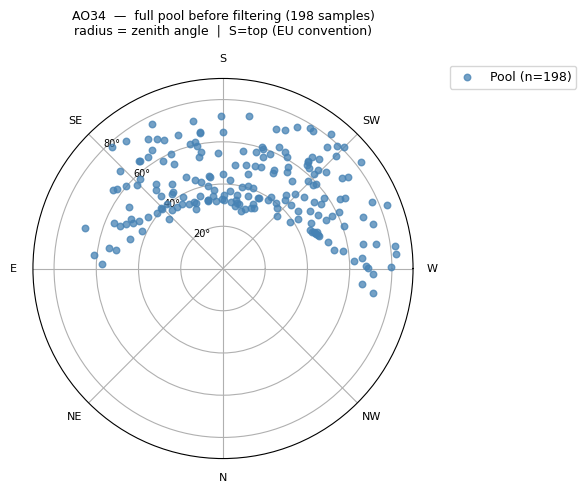

In [13]:
# ============================================================
#  Pool polar plot  —  all samples before filtering and splitting
# ============================================================

from nb_utils import rays_to_polar as _rays_to_polar

_az_plot_pool, _zen_pool = _rays_to_polar(pool_rays)

fig, ax = plt.subplots(figsize=(6, 6), subplot_kw={"projection": "polar"})
ax.scatter(_az_plot_pool, _zen_pool, s=22, color="steelblue", alpha=0.75, zorder=4,
           label=f"Pool (n={N_POOL_RAW})")
ax.set_rlim(0, 90)
ax.set_rticks([20, 40, 60, 80])
ax.set_yticklabels(["20°", "40°", "60°", "80°"], fontsize=7)
ax.set_rlabel_position(135)
ax.set_xticklabels(["W", "SW", "S", "SE", "E", "NE", "N", "NW"], fontsize=8)
ax.set_title(
    f"{HELIOSTAT_ID}  —  full pool before filtering ({N_POOL_RAW} samples)\n"
    "radius = zenith angle  |  S=top (EU convention)",
    fontsize=9, pad=14,
)
ax.legend(loc="upper left", bbox_to_anchor=(1.08, 1.05), fontsize=9)
plt.tight_layout()
plt.show()

In [14]:
# ============================================================
#  Filter pool  —  discard samples where GT flux is too sparse
# ============================================================

from nb_utils import active_pixel_percent as _active_pixel_percent

_active_pct = torch.tensor(
    [_active_pixel_percent(pool_flux[i]) for i in range(N_POOL_RAW)],
    dtype=torch.float32,
)
_keep     = (_active_pct >= MIN_ACTIVE_PIXEL_PERCENT)
_keep_dev = _keep.to(pool_flux.device)

pool_flux        = pool_flux[_keep_dev]
pool_centroids   = pool_centroids[_keep_dev]
pool_rays        = pool_rays[_keep_dev]
pool_motor_pos   = pool_motor_pos[_keep_dev]
pool_target_mask = pool_target_mask[_keep_dev]
N_POOL = int(_keep.sum().item())

print(f"Filter: kept {N_POOL}/{N_POOL_RAW}  (rejected {N_POOL_RAW - N_POOL} sparse samples, "
      f"threshold={MIN_ACTIVE_PIXEL_PERCENT:.1f}%)")

Filter: kept 198/198  (rejected 0 sparse samples, threshold=2.0%)


DatasetSplitter (balanced): train=98  val=50  test=50  [val↔test swapped]
Display elevations: [ 7.6 21.2 26.4 31.7 36.6 42.3 45.9 50.4 56.6 61.7] deg


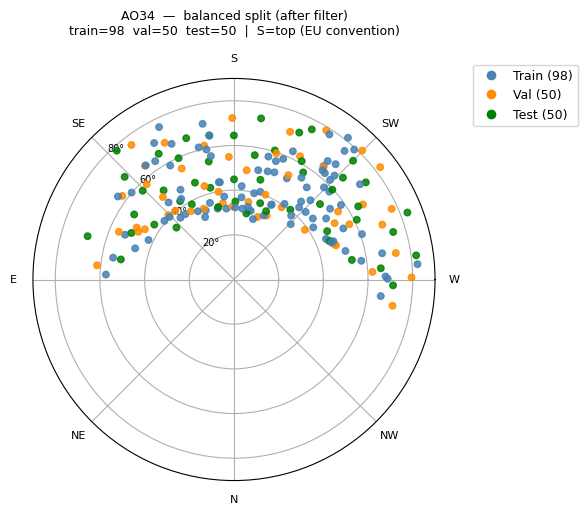

In [15]:
# ============================================================
#  DatasetSplitter  —  balanced re-split of the filtered pool
# ============================================================

_sun = -pool_rays.cpu().numpy()
_az  = np.degrees(np.arctan2(_sun[:, 0], _sun[:, 1])) % 360.0
_el  = np.degrees(np.arcsin(np.clip(_sun[:, 2], -1.0, 1.0)))

_pool_df = pd.DataFrame({
    paint_mappings.HELIOSTAT_ID: HELIOSTAT_ID,
    paint_mappings.AZIMUTH:      _az,
    paint_mappings.ELEVATION:    _el,
    paint_mappings.DATETIME:     pd.Timestamp("2020-06-15 12:00:00"),  # tiebreaker only
    paint_mappings.SPLIT_KEY:    "",
}, index=range(N_POOL))

_required = SPLITTER_TRAIN_SIZE + SPLITTER_VAL_SIZE + 10  # need at least this many samples to split (test set gets same count as val, plus some slack)
if N_POOL < _required:
    raise RuntimeError(
        f"Pool too small: need {_required} samples "
        f"(train={SPLITTER_TRAIN_SIZE} + val={SPLITTER_VAL_SIZE} + test={SPLITTER_VAL_SIZE} + 10) "
        f"but only {N_POOL} remain after filtering."
    )

if SPLITTER_TYPE == "balanced":
    _split_df = DatasetSplitter._get_balanced_splits(
        _pool_df, training_size=SPLITTER_TRAIN_SIZE, validation_size=SPLITTER_VAL_SIZE
    )
else:
    _split_df = DatasetSplitter._get_azimuth_splits(
        _pool_df, training_size=SPLITTER_TRAIN_SIZE, validation_size=SPLITTER_VAL_SIZE
    )

_train_idx = _split_df[_split_df[paint_mappings.SPLIT_KEY] == paint_mappings.TRAIN_INDEX].index.tolist()
_val_idx   = _split_df[_split_df[paint_mappings.SPLIT_KEY] == paint_mappings.VALIDATION_INDEX].index.tolist()
_test_idx  = _split_df[_split_df[paint_mappings.SPLIT_KEY] == paint_mappings.TEST_INDEX].index.tolist()

if SWAP_VAL_TEST:
    _val_idx, _test_idx = _test_idx, _val_idx

def _take(idx):
    t = torch.tensor(idx, device=pool_flux.device)
    return (
        pool_flux[t], pool_centroids[t], pool_rays[t], pool_motor_pos[t], pool_target_mask[t],
        torch.tensor([len(idx)], device=pool_flux.device, dtype=torch.long),
    )

(train_flux, train_centroids, train_rays,
 train_motor_pos, train_target_mask, train_active_mask) = _take(_train_idx)
(val_flux, val_centroids, val_rays,
 val_motor_pos, val_target_mask, val_active_mask) = _take(_val_idx)
(test_flux, test_centroids, test_rays,
 test_motor_pos, test_target_mask, test_active_mask) = _take(_test_idx)

N_TRAIN = len(_train_idx)
N_VAL   = len(_val_idx)
N_TEST  = len(_test_idx)

print(f"DatasetSplitter ({SPLITTER_TYPE}): "
      f"train={N_TRAIN}  val={N_VAL}  test={N_TEST}"
      + ("  [val↔test swapped]" if SWAP_VAL_TEST else ""))

# ---- Display indices: N_DISPLAY training samples spread by elevation -------
train_el  = torch.asin(-train_rays[:, 2].clamp(-1.0, 1.0)).rad2deg()
sorted_tr = torch.argsort(train_el)
_pick     = torch.linspace(0, len(sorted_tr) - 1, N_DISPLAY).long()
disp_idx  = sorted_tr[_pick]

disp_rays        = train_rays[disp_idx]
disp_target      = train_target_mask[disp_idx]
disp_gt_flux     = train_flux[disp_idx]
disp_gt_centroid = train_centroids[disp_idx]
disp_active_mask = torch.tensor([N_DISPLAY], device=device, dtype=torch.long)
disp_el          = train_el[disp_idx].cpu().numpy()
print(f"Display elevations: {disp_el.round(1)} deg")

# ---- Polar plot — split assignment ----------------------------------------
from matplotlib.lines import Line2D

_colors_pool = np.full(N_POOL, "lightgray", dtype=object)
for i in _train_idx: _colors_pool[i] = "steelblue"
for i in _val_idx:   _colors_pool[i] = "darkorange"
for i in _test_idx:  _colors_pool[i] = "green"

_az_plot_pool, _zen_pool = 3*np.pi/2 - np.radians(_az), 90 - _el

fig, ax = plt.subplots(figsize=(6, 6), subplot_kw={"projection": "polar"})
ax.scatter(_az_plot_pool, _zen_pool, s=22, c=list(_colors_pool), alpha=0.85, zorder=4)
ax.legend(handles=[
    Line2D([0],[0], marker="o", color="w", markerfacecolor="steelblue",  markersize=8, label=f"Train ({N_TRAIN})"),
    Line2D([0],[0], marker="o", color="w", markerfacecolor="darkorange", markersize=8, label=f"Val ({N_VAL})"),
    Line2D([0],[0], marker="o", color="w", markerfacecolor="green",      markersize=8, label=f"Test ({N_TEST})"),
], loc="upper left", bbox_to_anchor=(1.08, 1.05), fontsize=9)
ax.set_rlim(0, 90); ax.set_rticks([20, 40, 60, 80])
ax.set_yticklabels(["20°", "40°", "60°", "80°"], fontsize=7); ax.set_rlabel_position(135)
ax.set_xticklabels(["W", "SW", "S", "SE", "E", "NE", "N", "NW"], fontsize=8)
ax.set_title(
    f"{HELIOSTAT_ID}  —  {SPLITTER_TYPE} split (after filter)\n"
    f"train={N_TRAIN}  val={N_VAL}  test={N_TEST}  |  S=top (EU convention)",
    fontsize=9, pad=14,
)
plt.tight_layout()
plt.show()

## Visualization helpers

Three small utility functions used throughout the notebook:
- `_bitmap_centroid`: centre-of-mass of a flux image in pixel coordinates
- `_to_norm`: normalise a flux tensor to [0, 1] for display
- `_current_base_pos`: safely read the current base-position deviation

In [16]:
from nb_utils import (
    bitmap_centroid,
    normalize_for_display,
    current_base_pos,
)

# Local aliases so downstream cells are unchanged
_bitmap_centroid = bitmap_centroid
_to_norm         = normalize_for_display
_current_base_pos = lambda: current_base_pos(heliostat_group, device)

print("Helpers loaded from nb_utils.")

Helpers loaded from nb_utils.


Dataset type : Real PAINT calibration images
  Benchmark  : benchmark_split-balanced_train-100_validation-50_deflectometry
  Heliostat  : AO34
  Centroid   : UTIS
  Scenario   : /Users/alexandru/Master Thesis/master-thesis/scenarios/one_heliostat_scenarios/AO34/scenario.h5
  After filtering : train=98  val=50  test=50

  TRAIN SET  (98 samples)


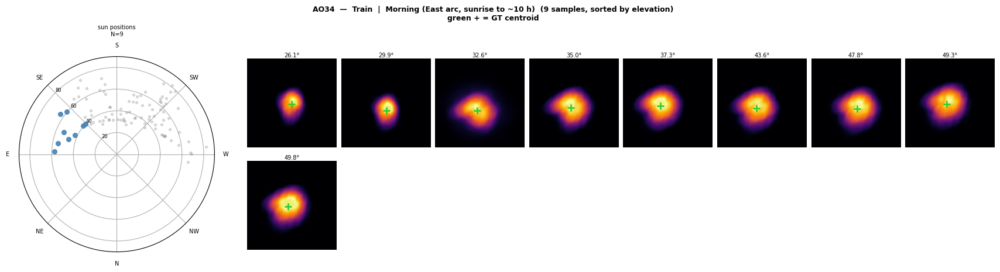

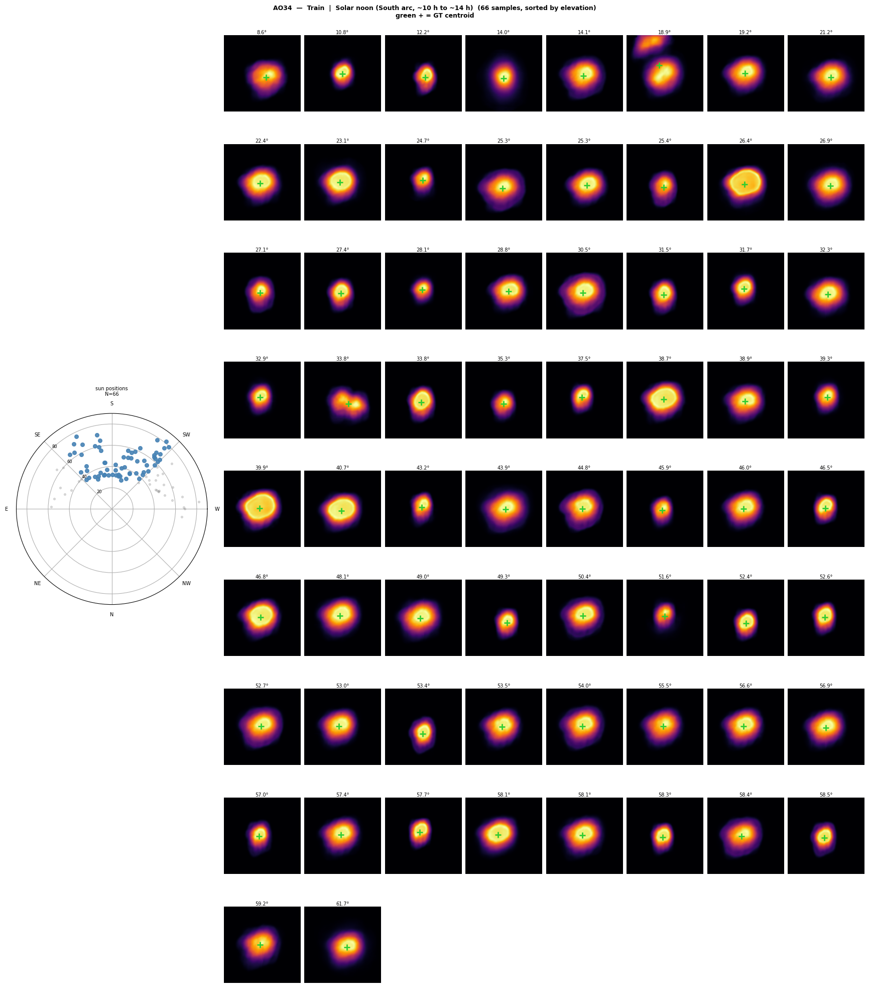

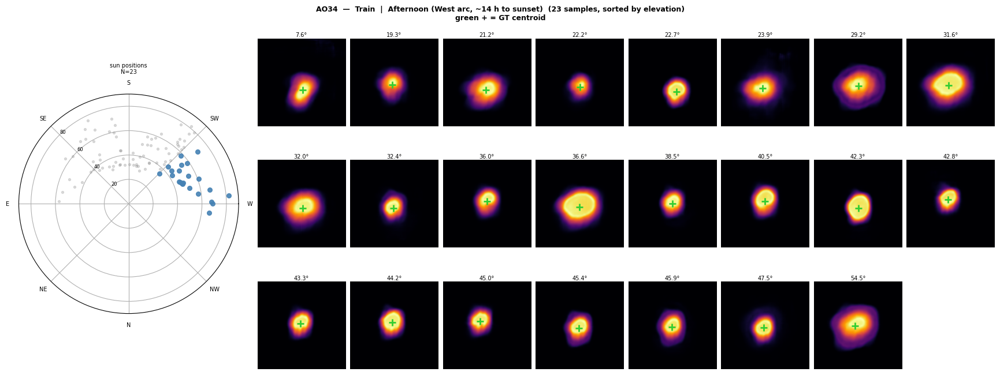

  END OF TRAIN SET

  VAL SET  (50 samples)


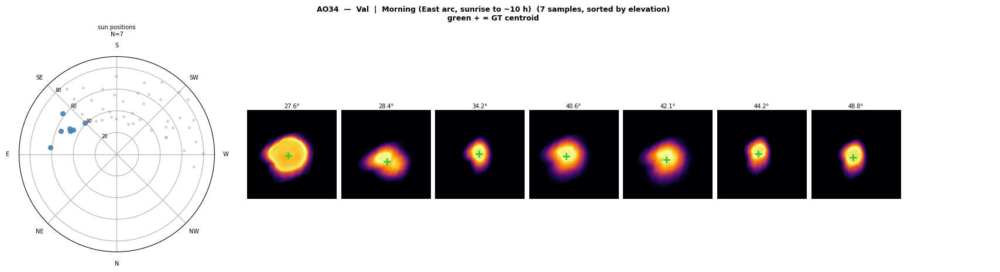

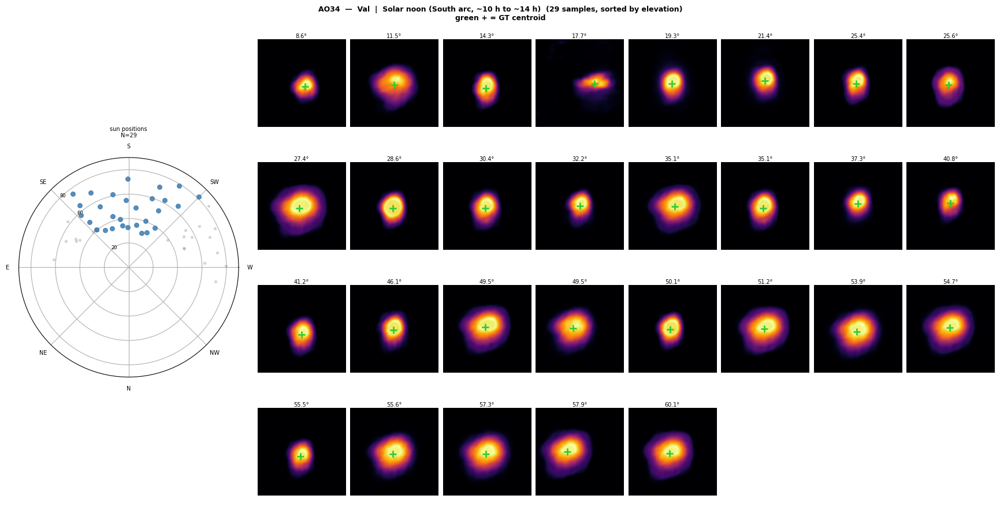

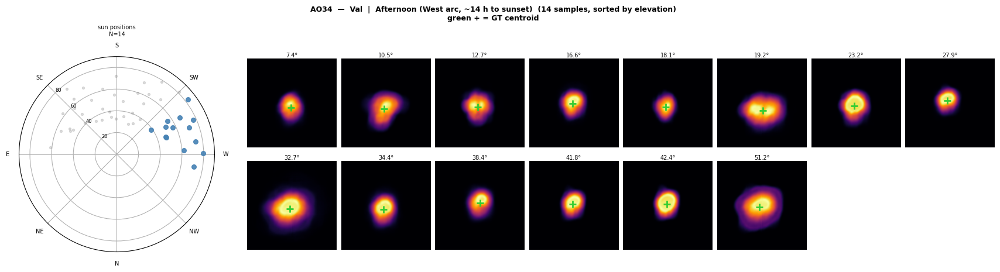

  END OF VAL SET

  TEST SET  (50 samples)  —  held out, not used in training


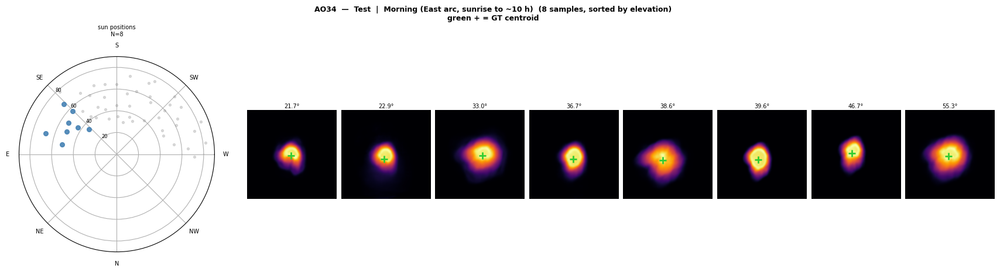

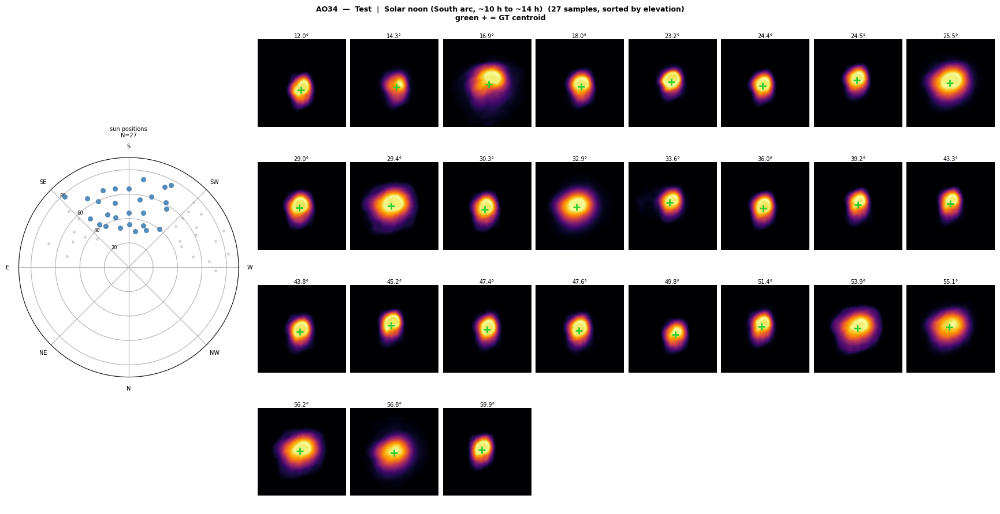

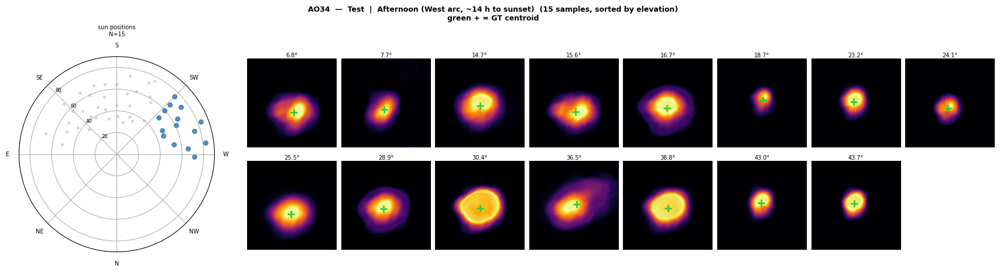

  END OF TEST SET


In [17]:
# ============================================================
#  Dataset overview: GT flux images + centroids for each split
# ============================================================

# --- Dataset description -------------------------------------------------------
def _dataset_description() -> str:
    """Return a human-readable description of the actual data source being used."""
    if DATA_MODE == "real":
        return (
            "Dataset type : Real PAINT calibration images\n"
            f"  Benchmark  : {BENCHMARK_NAME}\n"
            f"  Heliostat  : {HELIOSTAT_ID}\n"
            f"  Centroid   : {CENTROID_METHOD}\n"
            f"  Scenario   : {SCENARIO_PATH}"
        )
    elif DATA_MODE == "synthetic" and USE_CUSTOM_PERTURBATIONS:
        lines = ["Dataset type : In-memory synthetic data (custom perturbations)",
                 f"  Heliostat  : {HELIOSTAT_ID}",
                 f"  Rays/pt    : {GENERATE_RAYS}",
                 "  Perturbations (from CUSTOM_PERTURBATIONS_SPEC):"]
        for k, v in CUSTOM_PERTURBATIONS_SPEC.items():
            lines.append(f"    {k:<20s} = {v}")
        return "\n".join(lines)
    elif DATA_MODE == "synthetic":
        return (
            "Dataset type : Pre-generated synthetic data (from disk)\n"
            f"  Heliostat  : {HELIOSTAT_ID}\n"
            f"  Source dir : {SYNTH_DATASET_DIR}\n"
            f"  Perturbs   : loaded from {PERTURBATIONS_JSON}"
        )
    else:  # random_synthetic
        bound_lines = "  ".join(
            f"{k}=\u00b1{v}" for k, v in RANDOM_PERT_BOUNDS.items()
        )
        return (
            "Dataset type : In-memory random synthetic data\n"
            f"  Heliostat  : {HELIOSTAT_ID}\n"
            f"  Seed       : {RANDOM_SEED}\n"
            f"  Rays/pt    : {GENERATE_RAYS}\n"
            f"  Bounds     : {bound_lines}"
        )

print("=" * 60)
print(_dataset_description())
print(f"  After filtering : train={N_TRAIN}  val={N_VAL}  test={N_TEST}")
print("=" * 60)
print()


_N_COLS = 8   # images per row in each grid

_AZ_BINS = [
    ( 45, 135, 'Morning (East arc, sunrise to ~10 h)'),
    (135, 225, 'Solar noon (South arc, ~10 h to ~14 h)'),
    (225, 315, 'Afternoon (West arc, ~14 h to sunset)'),
    (315, 405, 'Other (North arc)'),
]


def _plot_split_grid(flux_tensor, rays_tensor, split_name, n_cols=_N_COLS):
    """Plot GT flux images split by time-of-day bin with a polar sun-position chart."""
    import matplotlib.gridspec as mgridspec

    n = len(flux_tensor)
    if n == 0:
        print(f"  {split_name}: no samples to plot")
        return

    rays_np     = rays_tensor.cpu().numpy()
    sun_dir     = -rays_np
    el_deg      = np.degrees(np.arcsin(np.clip(-rays_np[:, 2], -1.0, 1.0)))
    sun_az      = np.arctan2(sun_dir[:, 0], sun_dir[:, 1])  # rad: E=+pi/2, W=-pi/2
    sun_az_plot = 3 * np.pi / 2 - sun_az  # S=top, E=left (standard EU solar chart)
    sun_zen     = 90.0 - el_deg
    compass_az  = np.degrees(sun_az) % 360.0  # 0=N, 90=E, 180=S, 270=W

    for bin_lo, bin_hi, bin_label in _AZ_BINS:
        if bin_hi > 360:
            in_mask = (compass_az >= bin_lo) | (compass_az < bin_hi - 360)
        else:
            in_mask = (compass_az >= bin_lo) & (compass_az < bin_hi)
        idx_in  = np.where(in_mask)[0]
        idx_out = np.where(~in_mask)[0]
        if len(idx_in) == 0:
            continue

        sorted_in = idx_in[np.argsort(el_deg[idx_in])]
        n_in   = len(sorted_in)
        n_rows = (n_in + n_cols - 1) // n_cols

        fig = plt.figure(
            figsize=(2.8 + n_cols * 1.8, max(n_rows * 2.2, 4.5)),
            constrained_layout=True,
        )
        fig.suptitle(
            f"{HELIOSTAT_ID}  —  {split_name}  |  {bin_label}  ({n_in} samples, sorted by elevation)\n"
            "green + = GT centroid",
            fontsize=9, fontweight="bold",
        )

        gs = mgridspec.GridSpec(
            n_rows, n_cols + 1,
            figure=fig,
            width_ratios=[2.5] + [1.0] * n_cols,
        )

        ax_p = fig.add_subplot(gs[:, 0], projection="polar")
        ax_p.set_rlim(0, 90)
        ax_p.set_rticks([20, 40, 60, 80])
        ax_p.set_yticklabels(["20", "40", "60", "80"], fontsize=6)
        ax_p.set_rlabel_position(135)
        ax_p.set_xticklabels(["W", "SW", "S", "SE", "E", "NE", "N", "NW"], fontsize=7)
        ax_p.scatter(sun_az_plot[idx_out], sun_zen[idx_out], s=8,  color="gray",      alpha=0.25, zorder=2)
        ax_p.scatter(sun_az_plot[idx_in],  sun_zen[idx_in],  s=30, color="steelblue", alpha=0.90, zorder=5)
        ax_p.set_title(f"sun positions\nN={n_in}", fontsize=7, pad=8)

        for j, idx in enumerate(sorted_in):
            row, col = divmod(j, n_cols)
            ax = fig.add_subplot(gs[row, col + 1])
            ax.imshow(_to_norm(flux_tensor[idx]), cmap="inferno", vmin=0, vmax=1)
            cx, cy = _bitmap_centroid(flux_tensor[idx])
            if cx is not None:
                ax.plot(cx, cy, "+", color="limegreen", ms=8, mew=2, zorder=5)
            ax.set_title(f"{el_deg[idx]:.1f}\u00b0", fontsize=7, pad=2)
            ax.axis("off")

        for j in range(n_in, n_rows * n_cols):
            row, col = divmod(j, n_cols)
            fig.add_subplot(gs[row, col + 1]).axis("off")

        plt.show()


print("=" * 60)
print(f"  TRAIN SET  ({N_TRAIN} samples)")
print("=" * 60)
_plot_split_grid(train_flux, train_rays, "Train")
print("=" * 60)
print("  END OF TRAIN SET")
print("=" * 60)
print()

if val_flux is not None:
    print("=" * 60)
    print(f"  VAL SET  ({N_VAL} samples)")
    print("=" * 60)
    _plot_split_grid(val_flux, val_rays, "Val")
    print("=" * 60)
    print("  END OF VAL SET")
    print("=" * 60)
    print()
else:
    print("Val: no validation data available — nothing to plot")
    print()

print("=" * 60)
print(f"  TEST SET  ({N_TEST} samples)  —  held out, not used in training")
print("=" * 60)
_plot_split_grid(test_flux, test_rays, "Test")
print("=" * 60)
print("  END OF TEST SET")
print("=" * 60)


## Pre-training baseline

Runs the ray tracer with the clean (unperturbed) kinematic parameters and compares centroids to the synthetic GT across the **entire training set**. The plots are arranged as repeated predicted/GT pairs, with extra spacing between pairs so it is visually clear which images belong together.


Computing pre-training error (clean scenario vs. perturbed-data GT) ...
Pre-training (all training samples): mean = 3.1 mrad  max = 9.8 mrad


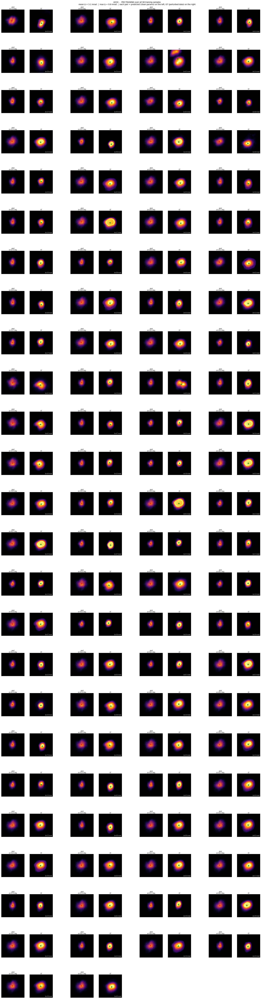

In [18]:
# ============================================================
#  Pre-training snapshot
#
#  The synthetic data was generated with PERTURBED kinematics.
#  Starting from the CLEAN scenario, the predicted centroids are
#  offset from the GT by approximately the perturbation magnitude.
#  This cell quantifies and visualises that initial error.
# ============================================================

print("Computing pre-training error (clean scenario vs. perturbed-data GT) ...")
scenario.set_number_of_rays(DISPLAY_RAYS)

with torch.no_grad():
    pre_pred_centroids, pre_pred_flux = _forward_pass(
        scenario, heliostat_group,
        train_rays, train_active_mask, train_target_mask,
        torch.zeros(1, 3, device=device),   # clean: no base-pos deviation
        device,
    )

scenario.set_number_of_rays(TRAIN_RAYS)

pre_shifts_train = (
    torch.norm(pre_pred_centroids[:, :3] - train_centroids[:, :3], dim=1)
    / hel_dist_m * 1000
).cpu().numpy()

print(f"Pre-training (all training samples): mean = {pre_shifts_train.mean():.1f} mrad  "
      f"max = {pre_shifts_train.max():.1f} mrad")

# __ Plot all training pairs _________________________________________________
import matplotlib.gridspec as mgridspec

_pair_cols = 4   # number of predicted/GT pairs per row
_sort_idx = torch.argsort(train_el).cpu().numpy()
_n_pairs = len(_sort_idx)
_n_rows = (_n_pairs + _pair_cols - 1) // _pair_cols
_width_ratios = []
for _ in range(_pair_cols):
    _width_ratios.extend([1.0, 1.0, 0.42])

fig = plt.figure(
    figsize=(_pair_cols * 5.2, _n_rows * 3.0),
    constrained_layout=True,
)
gs = mgridspec.GridSpec(
    _n_rows,
    len(_width_ratios),
    figure=fig,
    width_ratios=_width_ratios,
    wspace=0.05,
    hspace=0.35,
)

fig.suptitle(
    f"{HELIOSTAT_ID}  -  PRE-TRAINING over all {len(train_flux)} training samples\n"
    f"mean \u0394 = {pre_shifts_train.mean():.1f} mrad  |  max \u0394 = {pre_shifts_train.max():.1f} mrad  |  "
    "each pair = predicted (clean params) on the left, GT (perturbed data) on the right",
    fontsize=10,
)

for _j, _idx in enumerate(_sort_idx):
    _row = _j // _pair_cols
    _pair = _j % _pair_cols
    _col_base = _pair * 3

    _ax_pred = fig.add_subplot(gs[_row, _col_base])
    _ax_gt   = fig.add_subplot(gs[_row, _col_base + 1])
    _ax_gap  = fig.add_subplot(gs[_row, _col_base + 2])
    _ax_gap.axis("off")

    pf  = _to_norm(pre_pred_flux[_idx])
    gf  = _to_norm(train_flux[_idx])
    pcx, pcy = _bitmap_centroid(pre_pred_flux[_idx])
    gcx, gcy = _bitmap_centroid(train_flux[_idx])

    _ax_pred.imshow(pf, cmap="inferno", vmin=0, vmax=1)
    if pcx is not None:
        _ax_pred.plot(pcx, pcy, "+", color="red", ms=9, mew=2, zorder=5)
    _ax_pred.axis("off")

    _ax_gt.imshow(gf, cmap="inferno", vmin=0, vmax=1)
    if gcx is not None:
        _ax_gt.plot(gcx, gcy, "+", color="green", ms=9, mew=2, zorder=5)
    _ax_gt.axis("off")

    _el = float(train_el[_idx].cpu().item())
    _ax_pred.set_title(f"pred\nel={_el:.1f} deg", fontsize=7, pad=3)
    _ax_gt.set_title("GT", fontsize=7, pad=3)
    _ax_gt.text(
        0.97, 0.03, f"\u0394={pre_shifts_train[_idx]:.1f} mrad",
        transform=_ax_gt.transAxes,
        fontsize=6, color="white", ha="right", va="bottom",
        bbox=dict(boxstyle="round,pad=0.15", fc="black", alpha=0.5),
    )

# Hide any unused pair slots in the last row
for _j in range(_n_pairs, _n_rows * _pair_cols):
    _row = _j // _pair_cols
    _pair = _j % _pair_cols
    _col_base = _pair * 3
    for _offset in range(3):
        _ax = fig.add_subplot(gs[_row, _col_base + _offset])
        _ax.axis("off")

plt.show()

## Optimizer setup (Stage 1)

Enables gradients on all Wortberg parameters, registers gradient hooks (freeze actuator stroke length b_i, restrict non-optimizable params to c_i), snapshots initial values for bound clamping, and builds the Stage 1 Adam optimizer with differential learning rates.

In [19]:
from nb_utils import apply_bounds

# ============================================================
#  Optimizer setup (Stage 1)
#
#  Replicates WortbergKinematicReconstructor._setup_optimizer:
#  - enables gradients on all Wortberg parameters
#  - registers gradient hooks (freeze b_i stroke, only c_i in non_optimizable)
#  - creates _base_position_deviation = zeros (Stage 1 initialisation)
#  - snapshots initial values for deviation-bound clamping
#  - large-scale params (translation, base_position) get 5x base LR
# ============================================================

kinematic = heliostat_group.kinematics

# Remove any stale attributes from previous runs
for _attr in ("_initial_actuator_angle", "_initial_actuator_offset",
              "_initial_translation", "_base_position_deviation"):
    if hasattr(kinematic, _attr):
        delattr(kinematic, _attr)

# Enable gradients
kinematic.translation_deviation_parameters.requires_grad_(True)
kinematic.rotation_deviation_parameters.requires_grad_(True)
kinematic.actuators.optimizable_parameters.requires_grad_(True)
kinematic.actuators.non_optimizable_parameters.requires_grad_(True)

# Gradient hooks
def _freeze_stroke(grad):
    """Zero gradient for b_i (actuator_initial_stroke_length) - frozen during training."""
    mask = torch.ones_like(grad)
    mask[:, indices.actuator_initial_stroke_length, :] = 0.0
    return grad * mask

def _only_c_i(grad):
    """Allow gradient only for c_i (actuator_offset) in non_optimizable_parameters."""
    mask = torch.zeros_like(grad)
    mask[:, indices.actuator_offset, :] = 1.0
    return grad * mask

kinematic.actuators.optimizable_parameters.register_hook(_freeze_stroke)
kinematic.actuators.non_optimizable_parameters.register_hook(_only_c_i)

# Initialise _base_position_deviation to zero (Stage 1 creates it fresh)
kinematic._base_position_deviation = torch.zeros(1, 3, device=device, requires_grad=True)

# Snapshot initial values for bounds clamping
_init_translation = kinematic.translation_deviation_parameters.detach().clone()
_init_angle  = kinematic.actuators.optimizable_parameters[
    :, indices.actuator_initial_angle, :
].detach().clone()
_init_offset = kinematic.actuators.non_optimizable_parameters[
    :, indices.actuator_offset, :
].detach().clone()


# Store initial values on kinematic so apply_bounds() can reference them
kinematic._initial_translation     = _init_translation
kinematic._initial_actuator_angle  = _init_angle
kinematic._initial_actuator_offset = _init_offset

# _apply_bounds() is now imported from nb_utils; called as apply_bounds(k, bounds=TRAIN_BOUNDS)

def _all_params():
    """Return list of all optimised parameter tensors for gradient clipping."""
    k = heliostat_group.kinematics
    params = [
        k.translation_deviation_parameters,
        k.rotation_deviation_parameters,
        k.actuators.optimizable_parameters,
        k.actuators.non_optimizable_parameters,
    ]
    if hasattr(k, "_base_position_deviation"):
        params.append(k._base_position_deviation)
    return params


# Stage 1 optimizer (large-scale params get 5x base LR)
optimizer_s1 = torch.optim.Adam(
    [
        {"params": kinematic.translation_deviation_parameters,      "lr": BASE_LR * 5.0},
        {"params": kinematic.rotation_deviation_parameters,         "lr": BASE_LR},
        {"params": kinematic.actuators.optimizable_parameters,      "lr": BASE_LR},
        {"params": kinematic.actuators.non_optimizable_parameters,  "lr": BASE_LR},
        {"params": kinematic._base_position_deviation,              "lr": BASE_LR * 5.0},
    ],
    lr=BASE_LR,
)
scheduler_s1 = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_s1, mode="min", factor=0.5, patience=5,
    threshold=1e-4, cooldown=3, min_lr=1e-8,
)

print("Stage 1 optimizer ready.")
print(f"  rotation / actuator LR      : {BASE_LR:.0e}")
print(f"  translation / base_pos LR   : {BASE_LR * 5:.0e}")

Stage 1 optimizer ready.
  rotation / actuator LR      : 1e-04
  translation / base_pos LR   : 5e-04


## Trail capture setup

Defines `_capture_trails(label, epoch)`, which ray-traces all training samples with the current kinematic parameters and records:
- Predicted centroid pixel position per sample (for the visual trail)
- Mean and median focal-spot error in mrad across all samples (for the convergence curve)

Called once before training and every `PLOT_EVERY` epochs during both stages.

In [20]:
# ============================================================
#  Trail capture setup
#
#  _trail_checkpoints: list of dicts with keys:
#    "label"       - human-readable epoch label
#    "epoch"       - absolute epoch index (0 = pre-training)
#    "centroids"   - [(cx, cy), ...] per training sample (pixel coords)
#    "mrad_mean"   - mean focal-spot error across all training samples
#    "mrad_median" - median focal-spot error across all training samples
#    "aimed_2d"    - [N_TRAIN, 2] aimed point on receiver plane (m), NaN if missed
#    "target_dims" - [width_e, height_u] receiver dimensions (m)
# ============================================================

_trail_checkpoints = []


def _capture_trails(label: str, epoch: int) -> None:
    """Ray-trace all train samples; store centroid trail, train mrad, and test mrad."""
    with torch.no_grad():
        pred_cents, pred_flux = _forward_pass(
            scenario, heliostat_group,
            train_rays, train_active_mask, train_target_mask,
            _current_base_pos(), device,
        )

        # ---- Aimed-point computation (uses state left by _forward_pass) --------
        # active_surface_normals and active_heliostat_positions are set by the
        # alignment inside _forward_pass. Must compute before val _forward_pass
        # overwrites them.
        _planar      = scenario.solar_tower.target_areas[indices.planar_target_areas]
        _tidx        = int(train_target_mask[0].item())
        _c           = _planar.centers[_tidx, :3].float().to(device)    # receiver center [3]
        _pn          = _planar.normals[_tidx, :3].float().to(device)    # receiver plane normal [3]
        _target_dims = _planar.dimensions[_tidx].cpu().numpy()          # [width_e, height_u] m

        # Mean surface normal per training sample after kinematic alignment [N_TRAIN, 3]
        _n    = heliostat_group.active_surface_normals[:, :, :3].mean(dim=1)
        _n    = _n / _n.norm(dim=-1, keepdim=True).clamp(min=1e-8)

        # Heliostat origin per sample (base-pos deviation already applied) [N_TRAIN, 3]
        _orig = heliostat_group.kinematics.active_heliostat_positions[:, :3]

        # Reflected ray direction: r = d - 2(d.n)n
        _inc  = train_rays[:, :3]
        _dot  = (_inc * _n).sum(dim=-1, keepdim=True)
        _ref  = _inc - 2.0 * _dot * _n                                  # [N_TRAIN, 3]

        # Ray-plane intersection: t = dot(c - origin, pn) / dot(reflected, pn)
        _num   = ((_c - _orig) * _pn).sum(dim=-1)                       # [N_TRAIN]
        _den   = (_ref * _pn).sum(dim=-1)                               # [N_TRAIN]
        _den_s = _den.sign() * _den.abs().clamp(min=1e-8)               # sign-preserving clamp
        _t_raw = torch.where(_den.abs() > 1e-6, _num / _den_s,
                             torch.full_like(_num, float("nan")))
        _t     = torch.where(_t_raw > 0, _t_raw,
                             torch.full_like(_t_raw, float("nan")))     # NaN if backward hit
        _aimed3 = _orig + _t.unsqueeze(-1) * _ref                      # [N_TRAIN, 3]

        # Receiver 2D coordinate frame: right = east on receiver, up = ENU-up
        _up_w  = torch.tensor([0., 0., 1.], device=device)
        _right = torch.linalg.cross(_up_w, _pn)
        _right = _right / _right.norm().clamp(min=1e-8)
        _up2   = torch.linalg.cross(_pn, _right)
        _up2   = _up2 / _up2.norm().clamp(min=1e-8)

        _rel      = _aimed3 - _c                                        # [N_TRAIN, 3]
        _aimed_2d = torch.stack([
            (_rel * _right).sum(dim=-1),
            (_rel * _up2).sum(dim=-1),
        ], dim=-1).cpu().numpy()                                        # [N_TRAIN, 2]
        # ---- end aimed-point computation ---------------------------------------

    errs_mrad = (
        torch.norm(pred_cents[:, :3] - train_centroids[:, :3], dim=1)
        / hel_dist_m * 1000
    ).cpu().numpy()
    # Compute val mrad when val data is available (test set is never touched here)
    if val_flux is not None:
        with torch.no_grad():
            val_cents, _ = _forward_pass(
                scenario, heliostat_group,
                val_rays, val_active_mask, val_target_mask,
                _current_base_pos(), device,
            )
        val_errs_mrad = (
            torch.norm(val_cents[:, :3] - val_centroids[:, :3], dim=1)
            / hel_dist_m * 1000
        ).cpu().numpy()
        _mrad_val_mean = float(val_errs_mrad.mean())
    else:
        _mrad_val_mean = float("nan")

    _trail_checkpoints.append({
        "label":           label,
        "epoch":           epoch,
        "centroids":       [_bitmap_centroid(pred_flux[i]) for i in range(N_TRAIN)],
        "mrad_mean":       float(errs_mrad.mean()),
        "mrad_median":     float(np.median(errs_mrad)),
        "mrad_val_mean":   _mrad_val_mean,   # val only; test set is never evaluated here
        "errs_train_mrad": errs_mrad.tolist(),  # per-sample [N_TRAIN]
        "aimed_2d":        _aimed_2d,        # [N_TRAIN, 2] aimed point in receiver-plane coords (m)
        "target_dims":     _target_dims,     # [width_e, height_u] m
    })


print("Trail capture ready.")

_grad_history  = []  # gradient norms per epoch
_param_history = []  # parameter values per epoch


def _capture_grad_and_params(abs_epoch):
    """Record gradient norms and parameter deviations.
    Call after clip_grad_norm_(), before optimizer.step().
    """
    k = heliostat_group.kinematics

    def _gnorm(p):
        return float(p.grad.norm().item()) if p is not None and p.grad is not None else 0.0

    _grad_history.append({
        'epoch':          abs_epoch,
        'translation':    _gnorm(k.translation_deviation_parameters),
        'rotation':       _gnorm(k.rotation_deviation_parameters),
        'actuator_angle': _gnorm(k.actuators.optimizable_parameters),
        'actuator_offset':_gnorm(k.actuators.non_optimizable_parameters),
        'base_position':  _gnorm(k._base_position_deviation)
                          if hasattr(k, '_base_position_deviation') else 0.0,
    })

    angle_dev  = (
        k.actuators.optimizable_parameters[:, indices.actuator_initial_angle, :]
        - _init_angle
    ).detach().cpu().squeeze().tolist()
    offset_dev = (
        k.actuators.non_optimizable_parameters[:, indices.actuator_offset, :]
        - _init_offset
    ).detach().cpu().squeeze().tolist()

    _param_history.append({
        'epoch':          abs_epoch,
        'translation':    k.translation_deviation_parameters.detach().cpu().squeeze().tolist(),
        'rotation':       k.rotation_deviation_parameters.detach().cpu().squeeze().tolist(),
        'actuator_angle': angle_dev  if isinstance(angle_dev,  list) else [angle_dev],
        'actuator_offset':offset_dev if isinstance(offset_dev, list) else [offset_dev],
        'base_position':  k._base_position_deviation.detach().cpu().squeeze().tolist()
                          if hasattr(k, '_base_position_deviation') else [0.0, 0.0, 0.0],
    })


_test_evals = []  # test-set evaluation snapshots at key training milestones


def _capture_test_eval(label):
    """Evaluate current kinematics on the full test set and store results."""
    scenario.set_number_of_rays(DISPLAY_RAYS)
    with torch.no_grad():
        _pc, _pf = _forward_pass(
            scenario, heliostat_group,
            test_rays, test_active_mask, test_target_mask,
            _current_base_pos(), device,
        )
    scenario.set_number_of_rays(TRAIN_RAYS)
    _em = (torch.norm(_pc[:, :3] - test_centroids[:, :3], dim=1)
           / hel_dist_m * 1000).cpu().numpy()
    _test_evals.append({
        'label':     label,
        'flux':      _pf.cpu(),
        'errs_mrad': _em,
        'errs_m':    _em * hel_dist_m / 1000.0,
    })
    print(f'Test eval [{label}]: '
          f'mean={_em.mean():.4f} mrad  median={float(np.median(_em)):.4f} mrad')


_capture_test_eval('Pre-training')  # kinematics still clean at this point


Trail capture ready.
Test eval [Pre-training]: mean=3.2624 mrad  median=2.9519 mrad


## Stage 1 training - AlignmentLoss

Optimises kinematic parameters using motor-position MSE (no ray tracing). Fast per-epoch because it only runs the kinematic forward model. Captures a trail snapshot every `PLOT_EVERY` epochs.

In [21]:
# ============================================================
#  Stage 1 - AlignmentLoss  (motor-position MSE, no ray tracing)
# ============================================================

alignment_loss_fn = AlignmentLoss()
stage1_history     = []
stage1_val_history = []
_best_s1_mrad   = float("inf")
_best_s1_params = None

print(f"Stage 1: AlignmentLoss  |  {STAGE1_EPOCHS} epochs  |  all {N_TRAIN} samples/epoch")
print(f"Trail capture every {PLOT_EVERY} epochs.\n")

_capture_trails("pre", 0)   # epoch 0 = pre-training baseline
for epoch in tqdm_nb(range(1, STAGE1_EPOCHS + 1), desc="Stage 1"):
    optimizer_s1.zero_grad()
    kinematic = heliostat_group.kinematics

    # Activate heliostat with all N_TRAIN samples
    heliostat_group.activate_heliostats(
        active_heliostats_mask=train_active_mask, device=device
    )

    # Inject base-position deviation into active heliostat positions
    _bpd = kinematic._base_position_deviation            # [1, 3]  requires_grad
    _rep = _bpd.repeat_interleave(train_active_mask, dim=0)  # [N_TRAIN, 3]
    _pad = torch.zeros(_rep.shape[0], 1, device=device)
    kinematic.active_heliostat_positions = (
        kinematic.active_heliostat_positions + torch.cat([_rep, _pad], dim=1)
    )

    # Align surfaces (uses kinematic forward model - no ray tracing)
    heliostat_group.align_surfaces_with_incident_ray_directions(
        aim_points=scenario.solar_tower.get_centers_of_target_areas(
            train_target_mask, device
        ),
        incident_ray_directions=train_rays,
        active_heliostats_mask=train_active_mask,
        device=device,
    )

    # Predicted motor positions from kinematic model
    pred_mp = kinematic.active_motor_positions   # [N_TRAIN, 2]

    # AlignmentLoss: squared angular error via actuator model
    lps  = alignment_loss_fn(
        predicted_motor_positions=pred_mp,
        measured_motor_positions=train_motor_pos,
        actuators=kinematic.actuators,
        device=device,
    )   # [N_TRAIN]
    loss = lps.mean()
    loss.backward()

    torch.nn.utils.clip_grad_norm_(_all_params(), max_norm=1.0)
    optimizer_s1.step()
    apply_bounds(heliostat_group.kinematics, bounds=TRAIN_BOUNDS)
    _capture_grad_and_params(epoch)  # record post-update parameter values

    stage1_history.append(loss.item())

    # Validation AlignmentLoss on validation set (no ray tracing, no grad)
    _s1_val_loss = None
    if val_flux is not None:
        with torch.no_grad():
            heliostat_group.activate_heliostats(
                active_heliostats_mask=val_active_mask, device=device
            )
            _bpd_v = kinematic._base_position_deviation
            _rep_v = _bpd_v.repeat_interleave(val_active_mask, dim=0)
            _pad_v = torch.zeros(_rep_v.shape[0], 1, device=device)
            kinematic.active_heliostat_positions = (
                kinematic.active_heliostat_positions + torch.cat([_rep_v, _pad_v], dim=1)
            )
            heliostat_group.align_surfaces_with_incident_ray_directions(
                aim_points=scenario.solar_tower.get_centers_of_target_areas(
                    val_target_mask, device
                ),
                incident_ray_directions=val_rays,
                active_heliostats_mask=val_active_mask,
                device=device,
            )
            _val_pred_mp = kinematic.active_motor_positions
            _val_lps = alignment_loss_fn(
                predicted_motor_positions=_val_pred_mp,
                measured_motor_positions=val_motor_pos,
                actuators=kinematic.actuators,
                device=device,
            )
        _s1_val_loss = _val_lps.mean().item()
        stage1_val_history.append(_s1_val_loss)

    # Step scheduler with val loss when available, otherwise train loss
    scheduler_s1.step(_s1_val_loss if _s1_val_loss is not None else loss.item())

    if epoch % PLOT_EVERY == 0:
        _capture_trails(f"S1/{epoch}", epoch)
        # Best checkpoint = lowest val mrad (not alignment loss, which always decreases)
        _ckpt_s1 = _trail_checkpoints[-1]["mrad_val_mean"] if val_flux is not None else _trail_checkpoints[-1]["mrad_mean"]
        if _ckpt_s1 < _best_s1_mrad:
            _best_s1_mrad = _ckpt_s1
            _k = heliostat_group.kinematics
            _best_s1_params = {
                "translation": _k.translation_deviation_parameters.clone().detach(),
                "rotation":    _k.rotation_deviation_parameters.clone().detach(),
                "act_angle":   _k.actuators.optimizable_parameters.clone().detach(),
                "act_offset":  _k.actuators.non_optimizable_parameters.clone().detach(),
                "base_pos":    _k._base_position_deviation.clone().detach(),
            }

print(f"\nStage 1 complete. Final loss = {stage1_history[-1]:.6f}")

# Restore the Stage 1 checkpoint with the lowest val (or train) mrad
if _best_s1_params is not None:
    _k = heliostat_group.kinematics
    _k.translation_deviation_parameters.data.copy_(_best_s1_params["translation"])
    _k.rotation_deviation_parameters.data.copy_(_best_s1_params["rotation"])
    _k.actuators.optimizable_parameters.data.copy_(_best_s1_params["act_angle"])
    _k.actuators.non_optimizable_parameters.data.copy_(_best_s1_params["act_offset"])
    _k._base_position_deviation = (
        _best_s1_params["base_pos"].clone().requires_grad_(True)
    )
    _s1_metric = "val mrad" if val_flux is not None else "train mrad"
    print(f"Restored best Stage 1 params  ({_s1_metric} = {_best_s1_mrad:.4f} mrad)")

_capture_test_eval('After Stage 1')


Stage 1: AlignmentLoss  |  20 epochs  |  all 98 samples/epoch
Trail capture every 1 epochs.



Stage 1: 100%|██████████| 20/20 [00:05<00:00,  3.41it/s]



Stage 1 complete. Final loss = 0.001223
Restored best Stage 1 params  (val mrad = 3.8462 mrad)
Test eval [After Stage 1]: mean=3.9572 mrad  median=3.6328 mrad


## Stage 2 training - FocalSpotLoss

Continues from Stage 1 parameters. Optimises using ray-traced centroid MSE: the loss is the squared distance between the simulated flux centroid and the GT centroid on the receiver plane. Uses mini-batching to avoid memory issues. Captures a trail snapshot every `PLOT_EVERY` epochs.

In [22]:
# ============================================================
#  Stage 2 - FocalSpotLoss  (ray-traced centroid MSE)
#
#  Carry over Stage 1 parameters.  Re-enable grad on
#  _base_position_deviation so its Stage 1 values are preserved
#  and continue to be optimised.
# ============================================================

# Detach + re-attach so Stage 1 results feed into Stage 2 as leaf tensor
kinematic = heliostat_group.kinematics
kinematic._base_position_deviation = (
    kinematic._base_position_deviation.detach().requires_grad_(True)
)

optimizer_s2 = torch.optim.Adam(
    [
        {"params": kinematic.translation_deviation_parameters,     "lr": BASE_LR * 5.0},
        {"params": kinematic.rotation_deviation_parameters,        "lr": BASE_LR},
        {"params": kinematic.actuators.optimizable_parameters,     "lr": BASE_LR},
        {"params": kinematic.actuators.non_optimizable_parameters, "lr": BASE_LR},
        {"params": kinematic._base_position_deviation,             "lr": BASE_LR * 5.0},
    ],
    lr=BASE_LR,
)
scheduler_s2 = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_s2, mode="min", factor=0.5, patience=10,
    threshold=1e-4, cooldown=5, min_lr=1e-8,
)

focal_spot_loss_fn = FocalSpotLoss(scenario=scenario)
scenario.set_number_of_rays(TRAIN_RAYS)

n_mb         = (N_TRAIN + MINI_BATCH_SIZE - 1) // MINI_BATCH_SIZE
stage2_history     = []
stage2_val_history = []
_best_s2_loss   = float("inf")
_best_s2_params = None

print(f"Stage 2: FocalSpotLoss  |  {STAGE2_EPOCHS} epochs  |  "
      f"{n_mb} mini-batches of <={MINI_BATCH_SIZE} samples")
print(f"Trail capture every {PLOT_EVERY} epochs.\n")

for epoch in tqdm_nb(range(1, STAGE2_EPOCHS + 1), desc="Stage 2"):
    optimizer_s2.zero_grad()
    loss_accum = None

    for mb in range(n_mb):
        s = mb * MINI_BATCH_SIZE
        e = min(s + MINI_BATCH_SIZE, N_TRAIN)
        mb_size = e - s

        mb_rays     = train_rays[s:e]
        mb_target   = train_target_mask[s:e]
        mb_gt_cents = train_centroids[s:e]
        mb_active   = torch.tensor([mb_size], device=device, dtype=torch.long)

        kinematic = heliostat_group.kinematics
        heliostat_group.activate_heliostats(
            active_heliostats_mask=mb_active, device=device
        )

        # Inject base-position deviation (with gradient flow)
        _bpd = kinematic._base_position_deviation   # [1, 3]
        _rep = _bpd.repeat_interleave(mb_active, dim=0)  # [mb_size, 3]
        _pad = torch.zeros(_rep.shape[0], 1, device=device)
        kinematic.active_heliostat_positions = (
            kinematic.active_heliostat_positions + torch.cat([_rep, _pad], dim=1)
        )

        heliostat_group.align_surfaces_with_incident_ray_directions(
            aim_points=scenario.solar_tower.get_centers_of_target_areas(
                mb_target, device
            ),
            incident_ray_directions=mb_rays,
            active_heliostats_mask=mb_active,
            device=device,
        )

        ray_tracer = HeliostatRayTracer(
            scenario=scenario,
            heliostat_group=heliostat_group,
            blocking_active=False,
            world_size=1,
            rank=0,
            batch_size=max(8, mb_size),
            random_seed=epoch * 1000 + mb,  # vary per epoch+batch for unbiased ray sampling
        )
        flux, _, _, _ = ray_tracer.trace_rays(
            incident_ray_directions=mb_rays,
            active_heliostats_mask=mb_active,
            target_area_indices=mb_target,
            device=device,
        )
        sample_idx = ray_tracer.get_sampler_indices()

        lps = focal_spot_loss_fn(
            prediction=flux,
            ground_truth=mb_gt_cents[sample_idx],
            target_area_indices=mb_target[sample_idx],
            reduction_dimensions=(indices.focal_spots,),
            device=device,
        )   # [mb_size]

        # Accumulate loss across mini-batches weighted by actual sample count
        # (divide by N_TRAIN so each sample has equal weight, even for the last partial batch)
        (lps.mean() * (mb_size / N_TRAIN)).backward()
        mb_loss = lps.detach().mean() * (mb_size / N_TRAIN)
        loss_accum = mb_loss if loss_accum is None else loss_accum + mb_loss

    torch.nn.utils.clip_grad_norm_(_all_params(), max_norm=1.0)
    optimizer_s2.step()
    apply_bounds(heliostat_group.kinematics, bounds=TRAIN_BOUNDS)
    _capture_grad_and_params(STAGE1_EPOCHS + epoch)  # record post-update parameter values

    stage2_history.append(loss_accum.item())

    # Validation FocalSpotLoss on validation set (mini-batched, no grad)
    _s2_val_loss = None
    if val_flux is not None:
        with torch.no_grad():
            _n_mb_v = (N_VAL + MINI_BATCH_SIZE - 1) // MINI_BATCH_SIZE
            _val_accum = 0.0
            for _mb_v in range(_n_mb_v):
                _sv = _mb_v * MINI_BATCH_SIZE
                _ev = min(_sv + MINI_BATCH_SIZE, N_VAL)
                _msv = _ev - _sv
                _mbr_v  = val_rays[_sv:_ev]
                _mbt_v  = val_target_mask[_sv:_ev]
                _mbg_v  = val_centroids[_sv:_ev]
                _mba_v  = torch.tensor([_msv], device=device, dtype=torch.long)
                _kv = heliostat_group.kinematics
                heliostat_group.activate_heliostats(
                    active_heliostats_mask=_mba_v, device=device
                )
                _bpd_v = _kv._base_position_deviation
                _rep_v = _bpd_v.repeat_interleave(_mba_v, dim=0)
                _pad_v = torch.zeros(_rep_v.shape[0], 1, device=device)
                _kv.active_heliostat_positions = (
                    _kv.active_heliostat_positions + torch.cat([_rep_v, _pad_v], dim=1)
                )
                heliostat_group.align_surfaces_with_incident_ray_directions(
                    aim_points=scenario.solar_tower.get_centers_of_target_areas(
                        _mbt_v, device
                    ),
                    incident_ray_directions=_mbr_v,
                    active_heliostats_mask=_mba_v,
                    device=device,
                )
                _rt_v = HeliostatRayTracer(
                    scenario=scenario,
                    heliostat_group=heliostat_group,
                    blocking_active=False,
                    world_size=1, rank=0,
                    batch_size=max(8, _msv),
                    random_seed=42,
                )
                _flux_v, _, _, _ = _rt_v.trace_rays(
                    incident_ray_directions=_mbr_v,
                    active_heliostats_mask=_mba_v,
                    target_area_indices=_mbt_v,
                    device=device,
                )
                _sidx_v = _rt_v.get_sampler_indices()
                _lps_v = focal_spot_loss_fn(
                    prediction=_flux_v,
                    ground_truth=_mbg_v[_sidx_v],
                    target_area_indices=_mbt_v[_sidx_v],
                    reduction_dimensions=(indices.focal_spots,),
                    device=device,
                )
                _val_accum += _lps_v.mean().item() * (_msv / N_VAL)
        _s2_val_loss = _val_accum
        stage2_val_history.append(_s2_val_loss)

    # Step scheduler with val loss when available, otherwise train loss
    scheduler_s2.step(_s2_val_loss if _s2_val_loss is not None else loss_accum.item())

    # Best-checkpoint tracking (mirrors Stage 1 logic)
    _s2_monitor = _s2_val_loss if _s2_val_loss is not None else loss_accum.item()
    if _s2_monitor < _best_s2_loss:
        _best_s2_loss = _s2_monitor
        _k2 = heliostat_group.kinematics
        _best_s2_params = {
            "translation": _k2.translation_deviation_parameters.clone().detach(),
            "rotation":    _k2.rotation_deviation_parameters.clone().detach(),
            "act_angle":   _k2.actuators.optimizable_parameters.clone().detach(),
            "act_offset":  _k2.actuators.non_optimizable_parameters.clone().detach(),
            "base_pos":    _k2._base_position_deviation.clone().detach(),
        }

    if epoch % PLOT_EVERY == 0:
        _capture_trails(f"S2/{epoch}", STAGE1_EPOCHS + epoch)

print(f"\nStage 2 complete. Final loss = {stage2_history[-1]:.6f}")

# Restore the Stage 2 checkpoint with the lowest val (or train) loss
if _best_s2_params is not None:
    _k2 = heliostat_group.kinematics
    _k2.translation_deviation_parameters.data.copy_(_best_s2_params["translation"])
    _k2.rotation_deviation_parameters.data.copy_(_best_s2_params["rotation"])
    _k2.actuators.optimizable_parameters.data.copy_(_best_s2_params["act_angle"])
    _k2.actuators.non_optimizable_parameters.data.copy_(_best_s2_params["act_offset"])
    _k2._base_position_deviation = (
        _best_s2_params["base_pos"].clone().requires_grad_(True)
    )
    _s2_metric = "val loss" if val_flux is not None else "train loss"
    print(f"Restored best Stage 2 params  ({_s2_metric} = {_best_s2_loss:.6f})")


_capture_test_eval('After Stage 2')


Stage 2: FocalSpotLoss  |  100 epochs  |  4 mini-batches of <=25 samples
Trail capture every 1 epochs.



Stage 2: 100%|██████████| 100/100 [01:09<00:00,  1.44it/s]



Stage 2 complete. Final loss = 0.284512
Restored best Stage 2 params  (val loss = 0.250681)
Test eval [After Stage 2]: mean=2.8856 mrad  median=2.7758 mrad


## Centroid trail visualization - grouped by time of day

Training samples are split into **azimuth bins** (time of day),
not elevation bins. The sun's compass azimuth (0=N, 90=E, 180=S, 270=W)
determines which group each sample belongs to:

- **Morning** (East arc, az 45-135 deg): sun rising, beam coming from the right
- **Solar noon** (South arc, az 135-225 deg): sun near meridian, highest elevation
- **Afternoon** (West arc, az 225-315 deg): sun descending, beam from the left

For each group:
- **Left**: polar plot in European solar-chart orientation (South=top, West=right,
  East=left — looking south, as is standard for northern-hemisphere sun paths).
  Current-group samples in blue, all others dimmed. Radius = zenith angle
  (center = overhead, outer ring = horizon).
- **Right**: grayscale flux images with centroid trail. **Blues** = Stage 1
  (AlignmentLoss, light blue = early, dark blue = end of Stage 1).
  **Red-Yellow-Green** = Stage 2 (FocalSpotLoss, red = start, green = final).
  Green x marks the GT centroid, red + marks the predicted centroid.


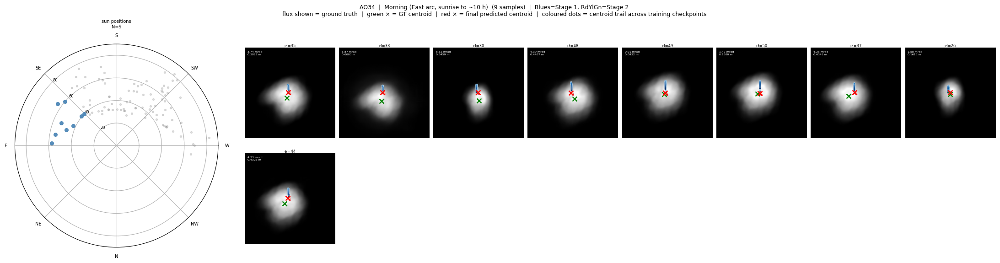

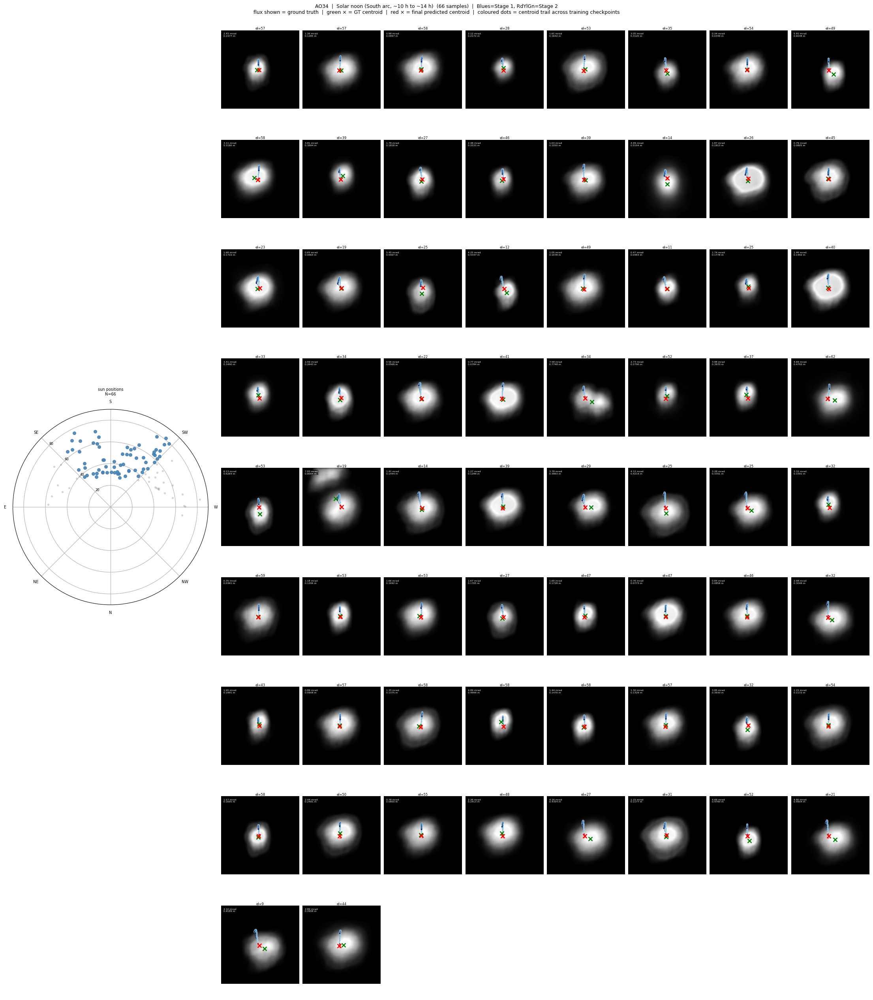

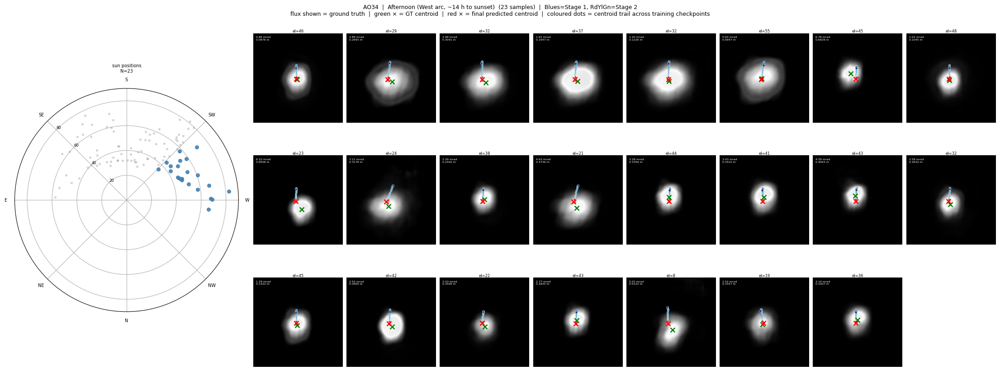

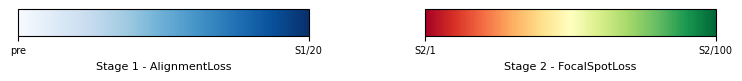

In [23]:
import matplotlib.gridspec as mgridspec

N_FLUX_COLS  = 8
train_el_np  = train_el.cpu().numpy()
_sun         = -train_rays.cpu().numpy()          # [N, 3] ENU sun direction
sun_az       = np.arctan2(_sun[:, 0], _sun[:, 1]) # rad: East=+pi/2, West=-pi/2
# Transform: S=top (pi/2 in math), E=left (pi), N=bottom (3pi/2), W=right (0)
sun_az_plot  = 3*np.pi/2 - sun_az
sun_zen      = 90.0 - train_el_np                 # zenith angle [deg]
compass_az   = np.degrees(sun_az) % 360.0         # 0=N, 90=E, 180=S, 270=W

# Precompute per-checkpoint trail colors.
# Stage 1 (pre/S1) uses Blues; Stage 2 uses RdYlGn (red=early, green=final).
_n_s1 = sum(1 for s in _trail_checkpoints if not s['label'].startswith('S2'))
_n_s2 = sum(1 for s in _trail_checkpoints if     s['label'].startswith('S2'))
_trail_colors = []
_s1_i = _s2_i = 0
for _snap in _trail_checkpoints:
    if _snap['label'].startswith('S2'):
        _t = _s2_i / max(_n_s2 - 1, 1)
        _trail_colors.append(plt.cm.RdYlGn(_t))
        _s2_i += 1
    else:
        _t = _s1_i / max(_n_s1 - 1, 1)
        _trail_colors.append(plt.cm.Blues(0.35 + 0.65 * _t))
        _s1_i += 1

# Per-sample mrad at the last captured epoch (for image annotations)
_final_mrad_per = np.array(_trail_checkpoints[-1]["errs_train_mrad"])  # [N_TRAIN]
_final_m_per    = _final_mrad_per * hel_dist_m / 1000.0

# Time-of-day bins defined by compass azimuth.
# Morning  : 45-135 deg (East arc)
# Solar noon: 135-225 deg (South arc)
# Afternoon : 225-315 deg (West arc)
# Other     : 315-360 / 0-45 deg (North arc, likely empty)
_az_bins = [
    ( 45, 135, 'Morning (East arc, sunrise to ~10 h)'),
    (135, 225, 'Solar noon (South arc, ~10 h to ~14 h)'),
    (225, 315, 'Afternoon (West arc, ~14 h to sunset)'),
    (315, 405, 'Other (North arc)'),
]

for _bin_lo, _bin_hi, _bin_label in _az_bins:
    if _bin_hi > 360:
        _in  = np.where((compass_az >= _bin_lo) | (compass_az < _bin_hi - 360))[0]
        _out = np.where((compass_az <  _bin_lo) & (compass_az >= _bin_hi - 360))[0]
    else:
        _in  = np.where((compass_az >= _bin_lo) & (compass_az < _bin_hi))[0]
        _out = np.where((compass_az <  _bin_lo) | (compass_az >= _bin_hi))[0]
    if len(_in) == 0:
        continue

    _n_in        = len(_in)
    _n_flux_rows = (_n_in + N_FLUX_COLS - 1) // N_FLUX_COLS

    _fig = plt.figure(
        figsize=(2.8 + N_FLUX_COLS * 2.4, max(_n_flux_rows, 1) * 2.8),
        constrained_layout=True,
    )
    _fig.suptitle(
        f"{HELIOSTAT_ID}  |  {_bin_label}  ({_n_in} samples)  |  Blues=Stage 1, RdYlGn=Stage 2\n"
        "flux shown = ground truth  |  green \u00d7 = GT centroid  |  red \u00d7 = final predicted centroid"
        "  |  coloured dots = centroid trail across training checkpoints",
        fontsize=9,
    )

    _gs = mgridspec.GridSpec(
        _n_flux_rows, N_FLUX_COLS + 1,
        figure=_fig,
        width_ratios=[2.5] + [1] * N_FLUX_COLS,
    )

    # Polar plot: standard compass orientation (CW, East=right)
    _ax_p = _fig.add_subplot(_gs[:, 0], projection='polar')
    # No set_theta_zero/direction: use default CCW math polar with transformed angles
    _ax_p.set_rlim(0, 90)
    _ax_p.set_rticks([20, 40, 60, 80])
    _ax_p.set_yticklabels(['20', '40', '60', '80'], fontsize=6)
    _ax_p.set_rlabel_position(135)
    _ax_p.set_xticklabels(['W', 'SW', 'S', 'SE', 'E', 'NE', 'N', 'NW'], fontsize=7)
    _ax_p.scatter(sun_az_plot[_out], sun_zen[_out], s=8,  color='gray',      alpha=0.25, zorder=2)
    _ax_p.scatter(sun_az_plot[_in],  sun_zen[_in],  s=30, color='steelblue', alpha=0.90, zorder=5)
    _ax_p.set_title(f'sun positions\nN={_n_in}', fontsize=7, pad=8)

    # Flux images with two-stage colour trail
    for _j, _idx in enumerate(_in):
        _row, _col = divmod(_j, N_FLUX_COLS)
        _ax = _fig.add_subplot(_gs[_row, _col + 1])
        _ax.imshow(_to_norm(train_flux[_idx]), cmap='gray', vmin=0, vmax=1)
        _gcx, _gcy = _bitmap_centroid(train_flux[_idx])
        if _gcx is not None:
            _ax.plot(_gcx, _gcy, 'x', color='green', ms=7, mew=1.8, zorder=10)
        _xs = [_s['centroids'][_idx][0] for _s in _trail_checkpoints]
        _ys = [_s['centroids'][_idx][1] for _s in _trail_checkpoints]
        _valid = [(t, x, y) for t, (x, y) in enumerate(zip(_xs, _ys)) if x is not None]
        for _k in range(len(_valid) - 1):
            _t0, _x0, _y0 = _valid[_k]
            _t1, _x1, _y1 = _valid[_k + 1]
            _col_mid = _trail_colors[(_t0 + _t1) // 2]
            _ax.plot([_x0, _x1], [_y0, _y1], '-', color=_col_mid, lw=0.8, alpha=0.75, zorder=4)
        for _t, _x, _y in _valid:
            _ax.plot(_x, _y, 'o', color=_trail_colors[_t], ms=3, zorder=5,
                     markeredgecolor='white', markeredgewidth=0.2)
        # Final predicted centroid
        if _valid:
            _, _fx, _fy = _valid[-1]
            _ax.plot(_fx, _fy, 'x', color='red', ms=7, mew=1.8, zorder=11)
        _ax.set_title(f'el={train_el_np[_idx]:.0f}', fontsize=6, pad=1)
        _ax.axis('off')
        # Corner annotation: final mrad + metres for this sample
        _ax.text(
            0.03, 0.97,
            f'{_final_mrad_per[_idx]:.2f} mrad\n'
            f'{_final_m_per[_idx]:.4f} m',
            transform=_ax.transAxes, fontsize=4.5, va='top', ha='left',
            color='white',
            bbox=dict(facecolor='black', alpha=0.55, pad=1, linewidth=0),
        )

    for _j in range(_n_in, _n_flux_rows * N_FLUX_COLS):
        _row, _col = divmod(_j, N_FLUX_COLS)
        _ax = _fig.add_subplot(_gs[_row, _col + 1])
        _ax.axis('off')

    plt.show()

# Two colorbars: one per stage
_fig_cb, _axes_cb = plt.subplots(1, 2, figsize=(9, 0.55))
_fig_cb.subplots_adjust(wspace=0.4, bottom=0.4)

_sm1 = plt.cm.ScalarMappable(cmap=plt.cm.Blues, norm=plt.Normalize(0, 1))
_sm1.set_array([])
_cb1 = _fig_cb.colorbar(_sm1, cax=_axes_cb[0], orientation='horizontal')
_cb1.set_label('Stage 1 - AlignmentLoss', fontsize=8)
_cb1.set_ticks([0, 1])
_cb1.set_ticklabels(['pre', f'S1/{STAGE1_EPOCHS}'], fontsize=7)

_sm2 = plt.cm.ScalarMappable(cmap=plt.cm.RdYlGn, norm=plt.Normalize(0, 1))
_sm2.set_array([])
_cb2 = _fig_cb.colorbar(_sm2, cax=_axes_cb[1], orientation='horizontal')
_cb2.set_label('Stage 2 - FocalSpotLoss', fontsize=8)
_cb2.set_ticks([0, 1])
_cb2.set_ticklabels([f'S2/1', f'S2/{STAGE2_EPOCHS}'], fontsize=7)

plt.show()


## Pointing error across training

Mean focal-spot error (mrad) plotted over all epochs for both Stage 1 and Stage 2 on a single axis.
Two curves are shown:
- **Train** (solid): mean mrad across all training samples.
- **Val** (dashed): mean mrad across all test/validation samples.

Both are computed by running the full kinematic forward model + ray trace at each captured epoch, so the unit is consistent across stages even though Stage 1 trains on AlignmentLoss and Stage 2 trains on FocalSpotLoss.

The vertical dashed line marks the Stage 1 -> Stage 2 transition.
A gap between train and val curves indicates overfitting.

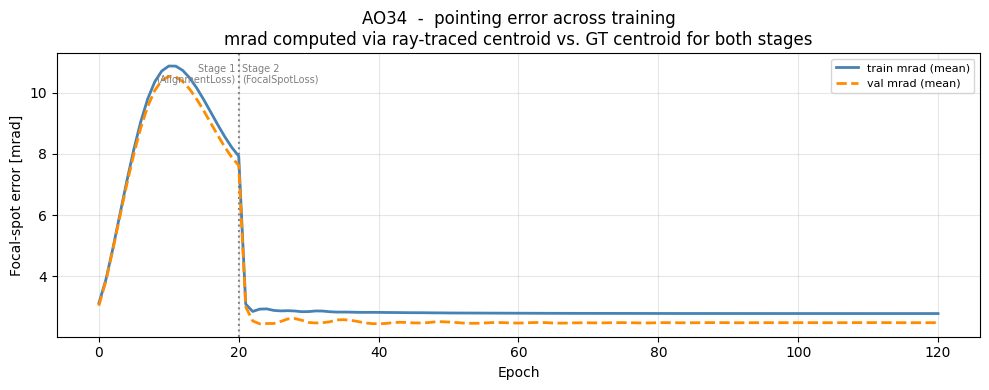

In [24]:
# ============================================================
#  Combined mrad convergence - Stage 1 + Stage 2
#
#  Training mrad (blue): mean focal-spot error across all training samples.
#  Validation mrad (orange): mean focal-spot error across all val samples.
#  Both computed by running the kinematic forward model + ray trace at each
#  captured epoch.  Vertical dashed line marks the Stage 1 -> Stage 2
#  transition.  Unit: mrad = distance_on_receiver / heliostat_distance * 1000.
# ============================================================

_epochs     = [c["epoch"]      for c in _trail_checkpoints]
_mrad_train = [c["mrad_mean"]  for c in _trail_checkpoints]
_mrad_val   = [c["mrad_val_mean"] for c in _trail_checkpoints]
_has_val    = val_flux is not None and not all(np.isnan(v) for v in _mrad_val)

fig, ax = plt.subplots(figsize=(10, 4))

ax.plot(_epochs, _mrad_train, lw=2.0, color="steelblue", label="train mrad (mean)")
if _has_val:
    ax.plot(_epochs, _mrad_val, lw=2.0, color="darkorange", ls="--", label="val mrad (mean)")

# Stage separator
_sep = STAGE1_EPOCHS
ax.axvline(_sep, color="gray", ls=":", lw=1.5, zorder=0)
_ymax = ax.get_ylim()[1]
ax.text(_sep - 0.5, _ymax * 0.97, "Stage 1\n(AlignmentLoss)",
        fontsize=7, color="gray", ha="right", va="top")
ax.text(_sep + 0.5, _ymax * 0.97, "Stage 2\n(FocalSpotLoss)",
        fontsize=7, color="gray", ha="left",  va="top")

ax.set_xlabel("Epoch")
ax.set_ylabel("Focal-spot error [mrad]")
ax.set_title(
    f"{HELIOSTAT_ID}  -  pointing error across training\n"
    "mrad computed via ray-traced centroid vs. GT centroid for both stages"
)
ax.legend(fontsize=8)
ax.grid(alpha=0.3)
plt.tight_layout()
plt.show()


## Gradient norms and parameter trajectories

Only shown when GT perturbations are known, which includes **synthetic mode**
and **random synthetic mode**.
In real mode this cell prints a skip message, because there are no
GT perturbation values to compare the optimizer trajectory against.

- **Top panel**: log-scale gradient norm per parameter group across all epochs.
  Stage 1 uses AlignmentLoss (no ray tracing), Stage 2 uses FocalSpotLoss.
- **Bottom panels**: current parameter value (solid) vs GT perturbation target
  (dashed) for each group. Convergence = solid lines reaching the dashed lines.


In [25]:
if pert_tensors is None:
    print("Real data mode: GT perturbations unknown -- parameter trajectory plot skipped.")
else:
    # Gradient norms and parameter trajectories across training.
    # Top row  : gradient norm per parameter group (log scale).
    # Bottom row: current parameter value vs GT (one subplot per group).
    # Both rows share the epoch x-axis; vertical dashed line = Stage 1 -> Stage 2.
    
    import matplotlib.gridspec as mgridspec
    
    _epochs_g  = [d['epoch'] for d in _grad_history]
    _epochs_p  = [d['epoch'] for d in _param_history]
    _sep       = STAGE1_EPOCHS
    
    # Ground-truth perturbation values (what the optimizer should converge to)
    _gt = {
        'translation':    pert_tensors['translation'][0].cpu().tolist(),
        'rotation':       pert_tensors['rotation'][0].cpu().tolist(),
        'actuator_angle': pert_tensors['actuator_angle'][0].cpu().tolist(),
        'actuator_offset':pert_tensors['actuator_offset'][0].cpu().tolist(),
        'base_position':  pert_tensors['base_position'][0].cpu().tolist(),
    }
    
    _groups = [
        ('translation',     'Translation deviation [m]',    [f't{i}' for i in range(9)]),
        ('rotation',        'Rotation deviation [rad]',     [f'r{i}' for i in range(4)]),
        ('actuator_angle',  'Actuator angle dev [rad]',     ['a0', 'a1']),
        ('actuator_offset', 'Actuator offset dev [m]',      ['c0', 'c1']),
        ('base_position',   'Base position dev [m]',        ['E', 'N', 'U']),
    ]
    n_groups = len(_groups)
    
    fig = plt.figure(figsize=(14, 4 + n_groups * 2.6))
    gs  = mgridspec.GridSpec(1 + n_groups, 1, figure=fig, hspace=0.55)
    
    # --- gradient norm plot ---
    ax_g = fig.add_subplot(gs[0])
    _grad_colors = ['steelblue', 'darkorange', 'green', 'red', 'purple']
    for (key, _, _labs), col in zip(_groups, _grad_colors):
        ax_g.semilogy(_epochs_g, [d[key] for d in _grad_history],
                      lw=1.4, color=col, label=key)
    ax_g.axvline(_sep, color='gray', ls=':', lw=1.2)
    ax_g.set_ylabel('Gradient norm (log)')
    ax_g.set_title(f'{HELIOSTAT_ID}  -  gradient norm per parameter group')
    ax_g.legend(fontsize=7, ncol=n_groups, loc='upper right')
    ax_g.grid(alpha=0.3)
    ax_g.text(_sep + 0.2, ax_g.get_ylim()[1], 'S2', fontsize=7, color='gray', va='top')
    
    # --- parameter trajectory plots ---
    _param_cmaps = ['Blues_r', 'Oranges_r', 'Greens_r', 'Reds_r', 'Purples_r']
    for row, ((key, ylabel, labels), pcmap) in enumerate(zip(_groups, _param_cmaps), start=1):
        ax_p = fig.add_subplot(gs[row])
        vals  = np.array([d[key] for d in _param_history])  # [T, n_params]
        if vals.ndim == 1:
            vals = vals[:, None]
        n_params = vals.shape[1]
        colors   = plt.get_cmap(pcmap)(np.linspace(0.25, 0.85, n_params))
    
        gt_vals = _gt[key]
        if not isinstance(gt_vals, list):
            gt_vals = [gt_vals]
    
        for pi in range(n_params):
            col = colors[pi]
            lbl = labels[pi] if pi < len(labels) else str(pi)
            ax_p.plot(_epochs_p, vals[:, pi], lw=1.2, color=col, label=lbl)
            ax_p.axhline(gt_vals[pi], color=col, ls='--', lw=0.8, alpha=0.7)
    
        ax_p.axhline(0, color='gray', ls='-', lw=0.5, alpha=0.4)
        ax_p.axvline(_sep, color='gray', ls=':', lw=1.2)
        ax_p.set_ylabel(ylabel, fontsize=8)
        ax_p.legend(fontsize=6, ncol=n_params, loc='upper right')
        ax_p.grid(alpha=0.3)
        if row == n_groups:
            ax_p.set_xlabel('Epoch')
    
    fig.text(0.5, 0.97,
             'Solid lines = current parameter value   Dashed lines = ground-truth perturbation',
             ha='center', fontsize=8, style='italic')
    plt.show()
    

Real data mode: GT perturbations unknown -- parameter trajectory plot skipped.


## Final evaluation

**Accuracy table**: mean and median focal-spot error in mrad and meters, reported per heliostat (= aggregated over all test samples for this single heliostat) at three training milestones: pre-training, after Stage 1, after Stage 2.

**Loss curves**: Stage 1 (AlignmentLoss) and Stage 2 (FocalSpotLoss) training loss over epochs.

**Test image pairs**: all test samples sorted by solar elevation. For each sample: top = predicted flux (red + = predicted centroid, green x = GT centroid, overlay shows mrad to 4 decimal places and in metres), bottom = GT flux.


Heliostat: AO34  |  test samples: 50

Stage                   Mean [mrad]  Median [mrad]   Mean [m] Median [m]
----------------------------------------------------------------------
Pre-training                 3.2624         2.9519   0.333432   0.301704
After Stage 1                3.9572         3.6328   0.404448   0.371287
After Stage 2                2.8856         2.7758   0.294925   0.283705


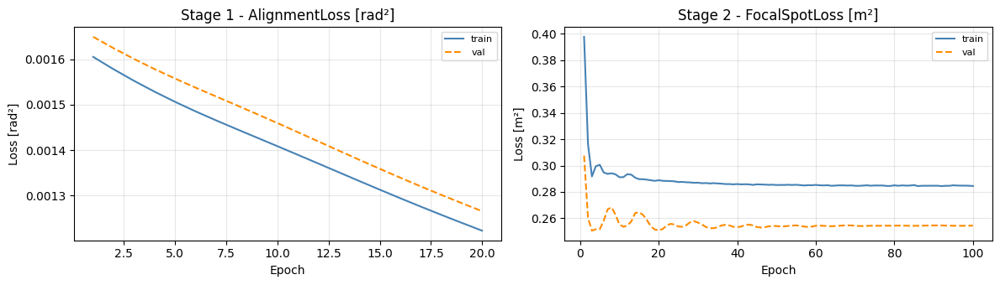

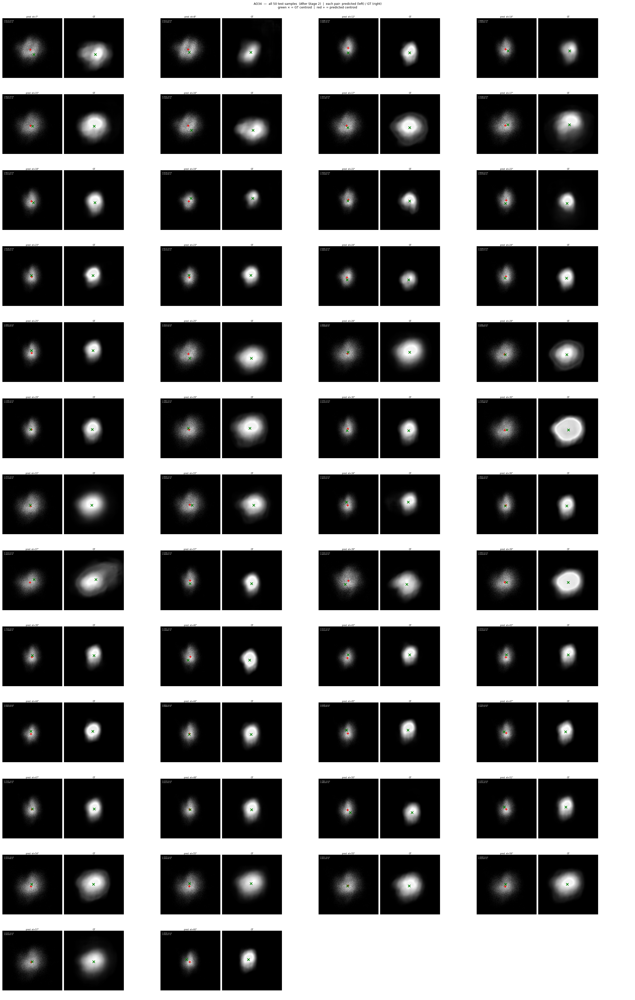

In [26]:
# Three-stage accuracy table (per heliostat = mean/median over all test samples)
print(f'Heliostat: {HELIOSTAT_ID}  |  test samples: {len(test_flux)}')
print()
print(f"{'Stage':<22} {'Mean [mrad]':>12} {'Median [mrad]':>14} {'Mean [m]':>10} {'Median [m]':>10}")
print('-' * 70)
for _ev in _test_evals:
    _mn  = _ev['errs_mrad'].mean()
    _med = float(np.median(_ev['errs_mrad']))
    print(f"{_ev['label']:<22} {_mn:12.4f} {_med:14.4f}"
          f" {_mn*hel_dist_m/1000:10.6f} {_med*hel_dist_m/1000:10.6f}")

# Loss curves with train and validation.
# Stage 1 AlignmentLoss unit: [rad^2]  (squared actuator joint-angle error)
# Stage 2 FocalSpotLoss unit: [m^2]    (squared centroid distance on receiver plane)
# See the "Pointing error across training" plot above for both stages in mrad.
_fig_l, _axes_l = plt.subplots(1, 2, figsize=(12, 3.5))
_ep1 = range(1, len(stage1_history) + 1)
_ep2 = range(1, len(stage2_history) + 1)
_axes_l[0].plot(_ep1, stage1_history,    lw=1.5, color='steelblue',  label='train')
if stage1_val_history:
    _axes_l[0].plot(_ep1, stage1_val_history, lw=1.5, color='darkorange', ls='--', label='val')
_axes_l[0].set(title='Stage 1 - AlignmentLoss [rad\u00b2]', xlabel='Epoch', ylabel='Loss [rad\u00b2]')
_axes_l[0].legend(fontsize=8)
_axes_l[0].grid(alpha=0.3)
_axes_l[1].plot(_ep2, stage2_history,    lw=1.5, color='steelblue',  label='train')
if stage2_val_history:
    _axes_l[1].plot(_ep2, stage2_val_history, lw=1.5, color='darkorange', ls='--', label='val')
_axes_l[1].set(title='Stage 2 - FocalSpotLoss [m\u00b2]', xlabel='Epoch', ylabel='Loss [m\u00b2]')
_axes_l[1].legend(fontsize=8)
_axes_l[1].grid(alpha=0.3)
plt.tight_layout()
plt.show()

# All test sample pairs: predicted (final model) vs GT
# Layout: pairs side-by-side [pred | GT] with padding between pairs.
# Sorted by elevation angle.
_test_el_np = torch.asin(-test_rays[:, 2].clamp(-1, 1)).rad2deg().cpu().numpy()
_sort_idx   = np.argsort(_test_el_np)
_final      = _test_evals[-1]  # After Stage 2

_N_T          = len(test_flux)
_PAIRS_PER_ROW = 4   # pairs (pred+GT) per row
_ROWS = (_N_T + _PAIRS_PER_ROW - 1) // _PAIRS_PER_ROW

# GridSpec: each pair slot = [pred, gt, gap]; gap col provides visual separation
_img_w, _gap_w = 1.0, 0.55
_wr = [_img_w, _img_w, _gap_w] * _PAIRS_PER_ROW

_fig_t = plt.figure(
    figsize=(_PAIRS_PER_ROW * (2 * 2.6 + 1.4), _ROWS * 3.2),
    constrained_layout=True,
)
_gs_t = mgridspec.GridSpec(_ROWS, len(_wr), figure=_fig_t, width_ratios=_wr)
_fig_t.suptitle(
    f'{HELIOSTAT_ID}  —  all {_N_T} test samples  (After Stage 2)  |  '
    'each pair: predicted (left) / GT (right)\n'
    'green \u00d7 = GT centroid  |  red + = predicted centroid',
    fontsize=9,
)

for _j, _idx in enumerate(_sort_idx):
    _row       = _j // _PAIRS_PER_ROW
    _pair      = _j %  _PAIRS_PER_ROW
    _col_pred  = _pair * 3
    _col_gt    = _pair * 3 + 1

    _pred_flux = _final['flux'][_idx]
    _gt_flux   = test_flux[_idx]
    _em        = _final['errs_mrad'][_idx]
    _em_m      = _final['errs_m'][_idx]
    _el        = _test_el_np[_idx]

    _pcx, _pcy = _bitmap_centroid(_pred_flux)
    _gcx, _gcy = _bitmap_centroid(_gt_flux)

    # Predicted
    _ax_p = _fig_t.add_subplot(_gs_t[_row, _col_pred])
    _ax_p.imshow(_to_norm(_pred_flux), cmap='gray', vmin=0, vmax=1)
    if _gcx is not None:
        _ax_p.plot(_gcx, _gcy, 'x', color='green', ms=7, mew=1.8, zorder=10)
    if _pcx is not None:
        _ax_p.plot(_pcx, _pcy, '+', color='red',   ms=7, mew=1.8, zorder=9)
    _ax_p.set_title(f'pred  el={_el:.0f}°', fontsize=6, pad=2)
    _ax_p.text(
        0.03, 0.97, f'{_em:.4f} mrad\n{_em_m:.6f} m',
        transform=_ax_p.transAxes, fontsize=4.5, va='top', ha='left', color='white',
        bbox=dict(facecolor='black', alpha=0.55, pad=1, linewidth=0),
    )
    _ax_p.axis('off')

    # GT
    _ax_g = _fig_t.add_subplot(_gs_t[_row, _col_gt])
    _ax_g.imshow(_to_norm(_gt_flux), cmap='gray', vmin=0, vmax=1)
    if _gcx is not None:
        _ax_g.plot(_gcx, _gcy, 'x', color='green', ms=7, mew=1.8, zorder=10)
    _ax_g.set_title('GT', fontsize=6, pad=2)
    _ax_g.axis('off')

    # Turn off gap column
    _fig_t.add_subplot(_gs_t[_row, _pair * 3 + 2]).axis('off')

# Hide unused pair slots in the last row
for _j in range(_N_T, _ROWS * _PAIRS_PER_ROW):
    _row  = _j // _PAIRS_PER_ROW
    _pair = _j %  _PAIRS_PER_ROW
    for _off in range(3):
        _fig_t.add_subplot(_gs_t[_row, _pair * 3 + _off]).axis('off')

plt.show()


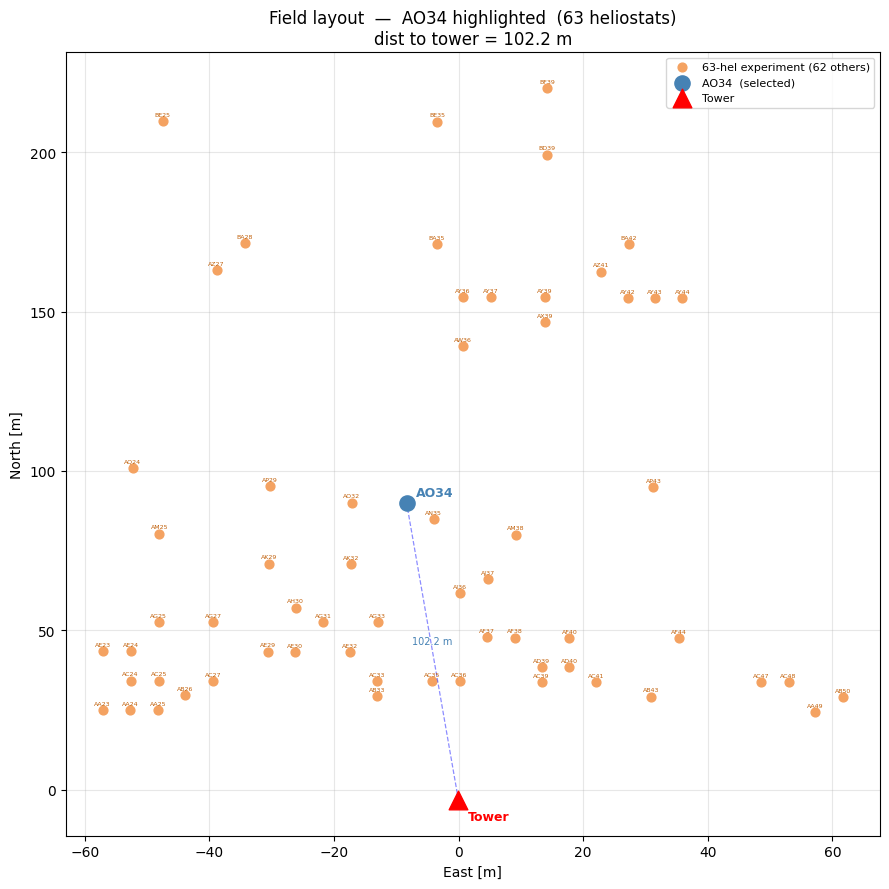

Loaded 63 heliostats from scenario.h5


In [27]:
# ============================================================
#  Heliostat field position plot
# ============================================================

_full_scenario_h5 = _base / "scenarios" / "full_63_heli_kin_reconstruct" / "scenario.h5"
_field_ids, _field_E, _field_N = [], [], []

with h5py.File(_full_scenario_h5, "r") as _f:
    for _hid, _hgroup in _f["heliostats"].items():
        _pos = _hgroup["position"][:]   # shape (4,): [E, N, U, 1]
        _field_ids.append(_hid)
        _field_E.append(float(_pos[0]))
        _field_N.append(float(_pos[1]))

    # Use only the main Jülich solar tower receiver panels (not multi_focus_tower)
    _ta_centers = [
        _f[f"target_areas_planar/{_n}/position_center"][()]
        for _n in _f["target_areas_planar"].keys()
        if "solar_tower" in _n.lower()
    ]
    _twr_E = float(np.mean([_c[0] for _c in _ta_centers]))
    _twr_N = float(np.mean([_c[1] for _c in _ta_centers]))

_sel_E = float(hel_pos[0].cpu().item())
_sel_N = float(hel_pos[1].cpu().item())

fig, ax = plt.subplots(figsize=(9, 9))

# Other 62 heliostats in the experiment (coral)
_others = [(e, n, h) for e, n, h in zip(_field_E, _field_N, _field_ids) if h != HELIOSTAT_ID]
if _others:
    _oe, _on, _oh = zip(*_others)
    ax.scatter(_oe, _on, c="#f4a261", s=40, zorder=2, label=f"63-hel experiment ({len(_others)} others)")
    for _e, _n, _h in zip(_oe, _on, _oh):
        ax.annotate(_h, (_e, _n), fontsize=4.5, color="#c1600a",
                    ha="center", va="bottom", xytext=(0, 3),
                    textcoords="offset points")

# Selected heliostat (steelblue)
ax.scatter([_sel_E], [_sel_N], c="steelblue", s=120, zorder=5,
           label=f"{HELIOSTAT_ID}  (selected)")
ax.annotate(HELIOSTAT_ID, (_sel_E, _sel_N), fontsize=9, fontweight="bold",
            color="steelblue", xytext=(7, 5), textcoords="offset points")

# Tower (red triangle)
ax.scatter([_twr_E], [_twr_N], c="red", marker="^", s=180, zorder=6, label="Tower")
ax.annotate("Tower", (_twr_E, _twr_N), fontsize=9, fontweight="bold",
            color="red", xytext=(7, -14), textcoords="offset points")

# Distance line
ax.plot([_twr_E, _sel_E], [_twr_N, _sel_N], "b--", lw=0.9, alpha=0.45)
ax.annotate(f"{hel_dist_m:.1f} m",
            xy=((_twr_E + _sel_E) / 2, (_twr_N + _sel_N) / 2),
            fontsize=7, color="steelblue", ha="center", va="bottom",
            xytext=(0, 4), textcoords="offset points")

ax.set_xlabel("East [m]")
ax.set_ylabel("North [m]")
ax.set_title(f"Field layout  —  {HELIOSTAT_ID} highlighted  ({len(_field_ids)} heliostats)\n"
             f"dist to tower = {hel_dist_m:.1f} m")
ax.legend(fontsize=8, loc="upper right")
ax.grid(alpha=0.3)
plt.tight_layout()
plt.show()

print(f"Loaded {len(_field_ids)} heliostats from {_full_scenario_h5.name}")


## Aimed-point trajectory

Where the heliostat's reflected beam **would** land on the receiver plane at each
trail-capture epoch, computed from the mean facet normal — no extra ray-tracing needed.

- Each curve = one training sample tracked across epochs.
- **Color** (plasma, dark→bright) = epoch number.
- **Circles** = Stage 1 (AlignmentLoss); **Triangles** = Stage 2 (FocalSpotLoss).
- Yellow rectangle = actual target boundary.

If AlignmentLoss is doing its job, samples that start outside the rectangle
should migrate inward during Stage 1, before Stage 2 refines them.

Samples starting outside target: 74 / 98


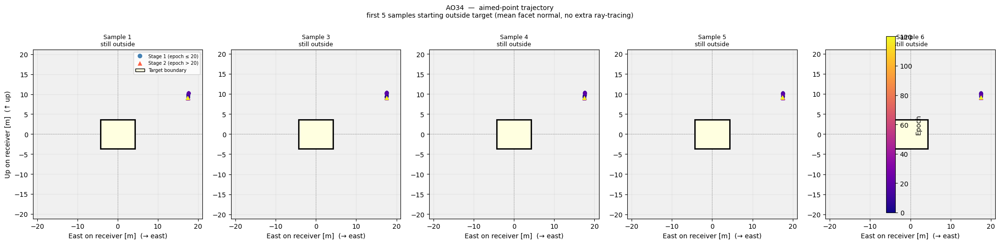

Pre-training :  74 / 98 samples outside or missing target
Final epoch  :  74 / 98 samples outside or missing target


In [28]:
# ============================================================
#  Aimed-point trajectory — one subplot per outside sample
#  (first 5 training samples whose initial aim misses the target)
# ============================================================

import matplotlib.cm as _mcm
import matplotlib.colors as _mcolors
from matplotlib.patches import Rectangle as _Rect
from matplotlib.lines import Line2D as _L2D

_ckpts = [c for c in _trail_checkpoints if "aimed_2d" in c]

if not _ckpts:
    print("No aimed_2d data in trail checkpoints — re-run training cells first.")
else:
    _tdims   = _ckpts[0]["target_dims"]
    _hw, _hh = _tdims[0] / 2.0, _tdims[1] / 2.0

    _epochs          = [c["epoch"] for c in _ckpts]
    _ep_min, _ep_max = _epochs[0], _epochs[-1]
    _n_samp          = _ckpts[0]["aimed_2d"].shape[0]
    _cmap            = _mcm.get_cmap("plasma")
    _norm            = _mcolors.Normalize(_ep_min, _ep_max)

    # Samples that start outside the target at epoch 0
    _start_pts  = _ckpts[0]["aimed_2d"]  # [N_TRAIN, 2]
    _is_outside = (
        (np.abs(_start_pts[:, 0]) > _hw) |
        (np.abs(_start_pts[:, 1]) > _hh) |
        np.isnan(_start_pts[:, 0])
    )
    _outside_idx = np.where(_is_outside)[0]
    print(f"Samples starting outside target: {len(_outside_idx)} / {_n_samp}")

    _plot_idx = _outside_idx[:5]
    if len(_plot_idx) == 0:
        print("No samples start outside the target — nothing to plot.")
    else:
        _np = len(_plot_idx)
        fig, _axes = plt.subplots(1, _np, figsize=(4.2 * _np, 4.8), squeeze=False)
        _axes = _axes[0]  # 1-D array of length _np

        for col, si in enumerate(_plot_idx):
            ax = _axes[col]
            ax.set_facecolor("#f0f0f0")

            _xs = np.array([c["aimed_2d"][si, 0] for c in _ckpts])
            _ys = np.array([c["aimed_2d"][si, 1] for c in _ckpts])
            _finite = np.isfinite(_xs) & np.isfinite(_ys)

            # Square axis extent large enough to show target + full trajectory
            if _finite.any():
                _ext = max(np.abs(_xs[_finite]).max(), np.abs(_ys[_finite]).max(),
                           _hw, _hh) * 1.2
            else:
                _ext = max(_hw, _hh) * 2.0

            # Target boundary rectangle
            ax.add_patch(_Rect((-_hw, -_hh), _tdims[0], _tdims[1],
                               lw=2, edgecolor="black", facecolor="lightyellow", zorder=2))
            ax.axhline(0, color="gray", lw=0.5, ls="--", zorder=1)
            ax.axvline(0, color="gray", lw=0.5, ls="--", zorder=1)

            # Trajectory line (matplotlib will gap NaN segments automatically)
            ax.plot(_xs, _ys, lw=0.8, color="gray", alpha=0.5, zorder=3)

            # One scatter point per captured epoch
            for ep, x, y in zip(_epochs, _xs, _ys):
                if not np.isfinite(x) or not np.isfinite(y):
                    continue
                _mk = "o" if ep <= STAGE1_EPOCHS else "^"
                ax.scatter(x, y, color=_cmap(_norm(ep)), s=30, marker=_mk,
                           zorder=4, linewidths=0)

            ax.set_xlim(-_ext, _ext)
            ax.set_ylim(-_ext, _ext)
            ax.set_aspect("equal")
            ax.set_xlabel("East on receiver [m]  (→ east)")
            if col == 0:
                ax.set_ylabel("Up on receiver [m]  (↑ up)")

            _end   = _ckpts[-1]["aimed_2d"][si]
            _inside = np.isfinite(_end[0]) and (abs(_end[0]) <= _hw) and (abs(_end[1]) <= _hh)
            ax.set_title(f"Sample {si}\n{'converged' if _inside else 'still outside'}", fontsize=9)
            ax.grid(alpha=0.2)

        # Shared colorbar
        _sm = plt.cm.ScalarMappable(cmap=_cmap, norm=_norm)
        _sm.set_array([])
        fig.colorbar(_sm, ax=_axes.tolist(), label="Epoch", fraction=0.02, pad=0.04)

        # Legend on first subplot
        _legend_handles = [
            _L2D([0], [0], marker="o", color="w", markerfacecolor="steelblue",
                 markersize=8, label=f"Stage 1 (epoch \u2264 {STAGE1_EPOCHS})"),
            _L2D([0], [0], marker="^", color="w", markerfacecolor="tomato",
                 markersize=8, label=f"Stage 2 (epoch > {STAGE1_EPOCHS})"),
            _Rect((0, 0), 1, 1, facecolor="lightyellow", edgecolor="black",
                  label="Target boundary"),
        ]
        _axes[0].legend(handles=_legend_handles, fontsize=7, loc="best")

        fig.suptitle(
            f"{HELIOSTAT_ID}  \u2014  aimed-point trajectory\n"
            "first 5 samples starting outside target "
            "(mean facet normal, no extra ray-tracing)",
            fontsize=10, y=1.02,
        )
        plt.tight_layout()
        plt.show()

        # Summary counts
        def _n_outside(pts):
            return int(
                ((np.abs(pts[:, 0]) > _hw) | (np.abs(pts[:, 1]) > _hh)
                 | np.isnan(pts[:, 0])).sum()
            )
        print(f"Pre-training : {_n_outside(_ckpts[0]['aimed_2d']):3d} / {_n_samp} samples outside or missing target")
        print(f"Final epoch  : {_n_outside(_ckpts[-1]['aimed_2d']):3d} / {_n_samp} samples outside or missing target")
